In [61]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import stats
from scipy.stats import norm

# Search for evidence of climate change in UK weather data



This notebook contains a basic model to analyse Met Office weather data from 1853 to 2022. The traditional statistical analysis section includes a model to make predictions for the weather, and to test the significance of the year 2022. The machine learning section includes a simple classifier to categorise the data into before or after 1990 based on a set of features.  



## Traditional statistical analysis



Firstly we need to load the data. A new variable $t_{\text{avg}}$ is defined.  



In [62]:
def preprocess_data(data, file):
    # Split the string values on whitespace and take the first value
    data = data.apply(lambda x: x.str.split().str[0]
                      if x.dtype == object else x)
    # Removing spaces
    data = data.apply(lambda x: x.str.strip() if x.dtype == object else x)
    #Replace non-numerical characters
    data.replace(to_replace='---', value=np.nan, inplace=True, regex=True)
    return data

In [63]:
# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames_avg = []

for file in data_files:
    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    #Preprocess the data
    df = preprocess_data(df, file)

    #Remove the first two rows
    df = df.iloc[2:]
    #Drop all columns other than the year, month, tmax and tmin
    df = df.drop(['af', 'rain', 'sun'], axis=1)
    #Convert the data type of the year and month columns to int
    #Drop missing values
    df = df.dropna()
    #Convert all entries other than the header to numeric
    df = df.apply(pd.to_numeric, errors='coerce')
    #Drop all rows with missing values
    df = df.dropna()
    df['yyyy'] = df['yyyy'].astype(int)
    df['mm'] = df['mm'].astype(int)
    #Convert the data type of the tmax and tmin columns to float
    df['tmax'] = df['tmax'].astype(float)
    df['tmin'] = df['tmin'].astype(float)
    #Calculate the average temperature
    df['avgtemp'] = (df['tmax'] + df['tmin']) / 2
    #Reset the index
    df = df.reset_index(drop=True)
    #Find the average temperature for each year
    df = df.groupby('yyyy').mean()
    #Reset the index
    df = df.reset_index()

    #Append the preprocessed data to the list
    data_frames_avg.append(df)

#Concatenate all the dataframes in the list
combined_data_tavg = pd.concat(data_frames_avg)
#remove mm column
combined_data_tavg = combined_data_tavg.drop(['mm'], axis=1)

combined_data_tavg

,yyyy,tmax,tmin,avgtemp
0,1961,12.720000,6.340000,9.530000
1,1962,10.625000,4.291667,7.458333
2,1963,10.408333,4.633333,7.520833
3,1964,11.183333,5.400000,8.291667
4,1965,10.408333,4.508333,7.458333
...,...,...,...,...
153,2018,13.708333,6.300000,10.004167
154,2019,13.866667,6.575000,10.220833
155,2020,13.950000,6.475000,10.212500
156,2021,14.058333,6.700000,10.379167


Plot the number of stations for each year  



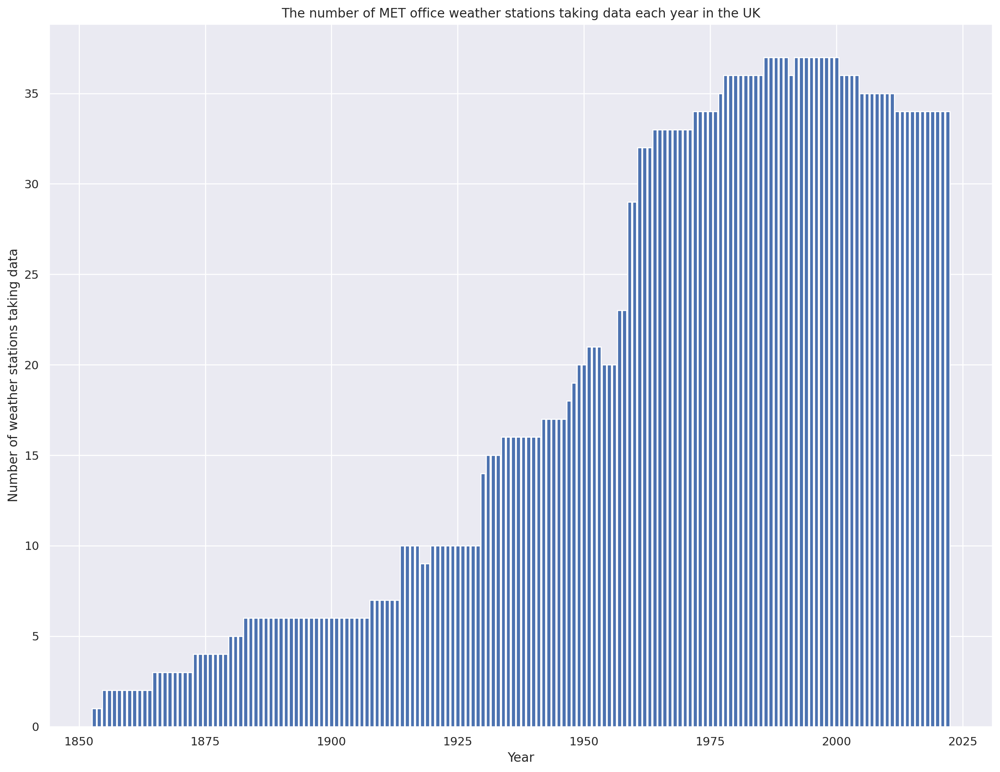

In [64]:
#Make a data frame for the year and the number of times it appears in the dataframe
df = pd.DataFrame(combined_data_tavg['yyyy'].value_counts())
#Rename the column
df = df.rename(columns={'yyyy': 'count'})
#Reset the index
df = df.reset_index()
#Rename the columns
df = df.rename(columns={'index': 'yyyy', 'count': 'count'})
#Sort the dataframe by year
df = df.sort_values(by=['yyyy'])

#Make a bar chart of the number of times each year appears in the dataframe
plt.figure(figsize=(16, 12))
plt.bar(df['yyyy'], df['count'])
plt.xlabel('Year')
plt.ylabel('Number of weather stations taking data')
plt.title(
    'The number of MET office weather stations taking data each year in the UK'
)
#Increase font size
plt.rcParams.update({'font.size': 20})
plt.show()
#Reset rcParams
plt.rcParams.update(plt.rcParamsDefault)

Take the average of each stations to give one set of measurements for each year  



In [65]:
#Add the number of stations for each year as a column to combined_data_tavg
combined_data_tavg = pd.merge(combined_data_tavg, df, on='yyyy')

#Find the average tmax, tmin and avgtemp for each year
combined_data_tavg = combined_data_tavg.groupby('yyyy').mean().reset_index()

combined_data_tavg

,yyyy,tmax,tmin,avgtemp,count
0,1853,12.816667,5.116667,8.966667,1.0
1,1854,14.075000,5.300000,9.687500,1.0
2,1855,12.833333,5.162500,8.997917,2.0
3,1856,13.775000,6.000000,9.887500,2.0
4,1857,14.766667,6.820833,10.793750,2.0
...,...,...,...,...,...
165,2018,13.792157,6.627206,10.209681,34.0
166,2019,13.742402,6.711275,10.226838,34.0
167,2020,13.978431,6.898284,10.438358,34.0
168,2021,13.507843,6.615196,10.061520,34.0


tmax: y =  -3.3058103915829995  +/-  0.8088866166226344
tmin: y =  -12.21948297039655  +/-  0.6458530956623194
avgtemp: y =  -7.68249698977146  +/-  0.6972721848156608
tmax: m =  0.00815604949259808  +/-  0.0004103347191851423
tmin: m =  0.009222809053548242  +/-  0.00032764873584040797
avgtemp: m =  0.008649111868286036  +/-  0.0003537258828344463


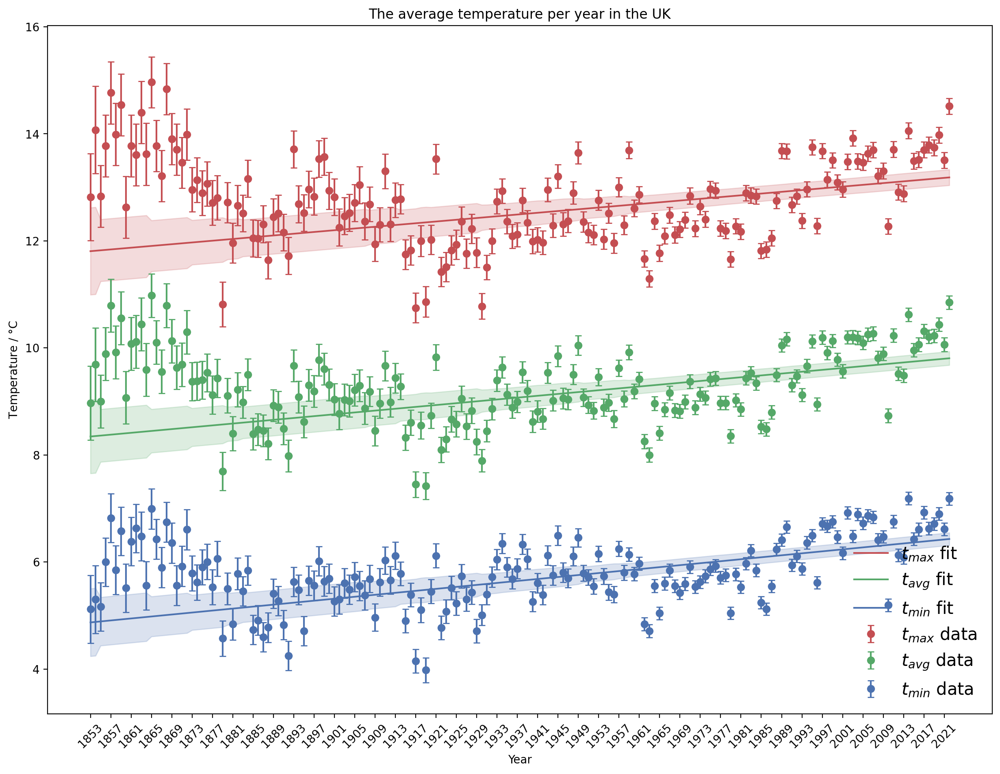

In [66]:
#Fit a curve to the data
m = 1  #the degree of polynomial

size = len(combined_data_tavg)
x = combined_data_tavg['yyyy']

ytmax = combined_data_tavg['tmax']
ytmin = combined_data_tavg['tmin']
yavgtemp = combined_data_tavg['avgtemp']


#define the function
def F(x, *theta):
    return sum([p * (x**i) for i, p in enumerate(theta)])


#Create a list of sigma values
#If station is before 1950, sigma = 0.1, if station is after 1950, sigma = 0.05
sigma_measurement = []
for i in range(len(combined_data_tavg)):
    if combined_data_tavg['yyyy'][i] < 1950:
        sigma_measurement.append(0.1)
    else:
        sigma_measurement.append(0.05)

#List of sigma_std_tmax, sigma_std_tmin and sigma_std_avgtemp
sigma_std_tmax = combined_data_tavg['tmax'].std() / np.sqrt(
    combined_data_tavg['count'])
sigma_std_tmin = combined_data_tavg['tmin'].std() / np.sqrt(
    combined_data_tavg['count'])
sigma_std_avgtemp = combined_data_tavg['avgtemp'].std() / np.sqrt(
    combined_data_tavg['count'])

#Combine uncertainties in quadrature
sigma_tmax = np.sqrt(np.square(sigma_measurement) + np.square(sigma_std_tmax))
sigma_tmin = np.sqrt(np.square(sigma_measurement) + np.square(sigma_std_tmin))
sigma_avgtemp = np.sqrt(
    np.square(sigma_measurement) + np.square(sigma_std_avgtemp))

#Fit the curve
p0 = np.linspace(1, 1, m + 1)
thetaHat_tmax, cov_tmax = curve_fit(F,
                                    x,
                                    ytmax,
                                    p0,
                                    sigma=sigma_tmax,
                                    absolute_sigma=True)
xPlot = combined_data_tavg['yyyy']
fit_tmax = F(xPlot, *thetaHat_tmax)

thetaHat_tmin, cov_tmin = curve_fit(F,
                                    x,
                                    ytmin,
                                    p0,
                                    sigma=sigma_tmin,
                                    absolute_sigma=True)
fit_tmin = F(xPlot, *thetaHat_tmin)

thetaHat_avgtemp, cov_avgtemp = curve_fit(F,
                                          x,
                                          yavgtemp,
                                          p0,
                                          sigma=sigma_avgtemp,
                                          absolute_sigma=True)
fit_avgtemp = F(xPlot, *thetaHat_avgtemp)

#Print the values for the y intercept and the slope along with their uncertainties
print('tmax: y = ', thetaHat_tmax[0], ' +/- ', np.sqrt(cov_tmax[0, 0]))
print('tmin: y = ', thetaHat_tmin[0], ' +/- ', np.sqrt(cov_tmin[0, 0]))
print('avgtemp: y = ', thetaHat_avgtemp[0], ' +/- ', np.sqrt(cov_avgtemp[0,
                                                                         0]))

print('tmax: m = ', thetaHat_tmax[1], ' +/- ', np.sqrt(cov_tmax[1, 1]))
print('tmin: m = ', thetaHat_tmin[1], ' +/- ', np.sqrt(cov_tmin[1, 1]))
print('avgtemp: m = ', thetaHat_avgtemp[1], ' +/- ', np.sqrt(cov_avgtemp[1,
                                                                         1]))

#Plot the fitted curve with the standard deviation
plt.figure(figsize=(15, 11))
xPlot = combined_data_tavg['yyyy']
ticks = np.arange(min(xPlot), max(xPlot), 4)
plt.xticks(ticks, rotation=45)
plt.plot(combined_data_tavg['yyyy'], fit_tmax, 'r-', label=r'$t_{max}$ fit')
plt.plot(combined_data_tavg['yyyy'], fit_avgtemp, 'g-', label=r'$t_{avg}$ fit')
plt.plot(combined_data_tavg['yyyy'], fit_tmin, 'b-', label=r'$t_{min}$ fit')
#fill the area between the curve and the standard deviation
stddev_tmax = combined_data_tavg['tmax'].std()
stddev_tmin = combined_data_tavg['tmin'].std()
stddev_avgtemp = combined_data_tavg['avgtemp'].std()
plt.fill_between(combined_data_tavg['yyyy'],
                 fit_tmax - sigma_tmax,
                 fit_tmax + sigma_tmax,
                 color='r',
                 alpha=0.2)
plt.fill_between(combined_data_tavg['yyyy'],
                 fit_tmin - sigma_tmin,
                 fit_tmin + sigma_tmin,
                 color='b',
                 alpha=0.2)
plt.fill_between(combined_data_tavg['yyyy'],
                 fit_avgtemp - sigma_avgtemp,
                 fit_avgtemp + sigma_avgtemp,
                 color='g',
                 alpha=0.2)
plt.errorbar(combined_data_tavg['yyyy'],
             ytmax,
             yerr=sigma_tmax,
             fmt='ro',
             label=r'$t_{max}$ data',
             capsize=3)
plt.errorbar(combined_data_tavg['yyyy'],
             yavgtemp,
             yerr=sigma_avgtemp,
             fmt='go',
             label=r'$t_{avg}$ data',
             capsize=3)
plt.errorbar(combined_data_tavg['yyyy'],
             ytmin,
             yerr=sigma_tmin,
             fmt='bo',
             label=r'$t_{min}$ data',
             capsize=3)
plt.xlabel('Year')
plt.ylabel(r'Temperature / $\degree$C')
plt.title(r'The average temperature per year in the UK')
#Increase font size
plt.rcParams.update({'font.size': 15})
plt.legend(loc='lower right', frameon=False)
plt.show()

#Reset rcParams
plt.rcParams.update(plt.rcParamsDefault)

Calculate the significance of each temperature rate of change  



In [67]:
#Loop over tmax, avgtemp and tmin to find the Z value
for i in range(3):
    if i == 0:
        print('tmax:')
        slope_uncertainty = np.sqrt(cov_tmax[1, 1])
        slope = thetaHat_tmax[1]
        z_value = slope / slope_uncertainty
        p_value = stats.norm.cdf(-z_value) * 2
    elif i == 1:
        print('tavg:')
        slope_uncertainty = np.sqrt(cov_avgtemp[1, 1])
        slope = thetaHat_avgtemp[1]
        z_value = slope / slope_uncertainty
        p_value = stats.norm.cdf(-z_value) * 2
    else:
        print('tmin:')
        slope_uncertainty = np.sqrt(cov_tmin[1, 1])
        slope = thetaHat_tmin[1]
        z_value = slope / slope_uncertainty
        p_value = stats.norm.cdf(-z_value) * 2
    if p_value < 0.05:
        print("The slope is significantly different from 0 at the 5% level.")
    else:
        print(
            "The slope is not significantly different from 0 at the 5% level.")
    print("Z value: ", z_value)
    slope_confidence_interval = stats.norm.interval(0.95,
                                                    loc=slope,
                                                    scale=slope_uncertainty)
    print("95% confidence interval for the slope: ", slope_confidence_interval)

tmax:
The slope is significantly different from 0 at the 5% level.
Z value:  19.87657663673857
95% confidence interval for the slope:  (0.007351808221388845, 0.008960290763807317)
tavg:
The slope is significantly different from 0 at the 5% level.
Z value:  24.451453195846756
95% confidence interval for the slope:  (0.007955821877530887, 0.009342401859041186)
tmin:
The slope is significantly different from 0 at the 5% level.
Z value:  28.148465245538176
95% confidence interval for the slope:  (0.008580629331720964, 0.00986498877537552)


Make future predictions for the temperature variables  



In [68]:
#Predictions for the future
std_fit_tmax = np.sqrt(np.diag(cov_tmax))
std_fit_tmin = np.sqrt(np.diag(cov_tmin))
std_fit_avgtemp = np.sqrt(np.diag(cov_avgtemp))

tmax_unc = np.sqrt(np.sum((std_fit_tmax)**2))
tmin_unc = np.sqrt(np.sum((std_fit_tmin)**2))
avgtemp_unc = np.sqrt(np.sum((std_fit_avgtemp)**2))

#Make a table of the predicted values with the uncertainties
table_temp = pd.DataFrame(
    {
        f'tmax (+/- {tmax_unc.round(2)})': [
            F(2050, *thetaHat_tmax),
            F(2060, *thetaHat_tmax),
            F(2070, *thetaHat_tmax),
            F(2080, *thetaHat_tmax),
            F(2090, *thetaHat_tmax),
            F(2100, *thetaHat_tmax)
        ],
        f'tmin (+/- {tmin_unc.round(2)})': [
            F(2050, *thetaHat_tmin),
            F(2060, *thetaHat_tmin),
            F(2070, *thetaHat_tmin),
            F(2080, *thetaHat_tmin),
            F(2090, *thetaHat_tmin),
            F(2100, *thetaHat_tmin)
        ],
        f'avgtemp (+/- {avgtemp_unc.round(2)})': [
            F(2050, *thetaHat_avgtemp),
            F(2060, *thetaHat_avgtemp),
            F(2070, *thetaHat_avgtemp),
            F(2080, *thetaHat_avgtemp),
            F(2090, *thetaHat_avgtemp),
            F(2100, *thetaHat_avgtemp)
        ]
    },
    index=[2050, 2060, 2070, 2080, 2090, 2100])
table_temp.index.name = 'Year'
table_temp.columns.name = 'Temperature'

#round all the values to 2 decimal places
table_temp = table_temp.round(2)

#Print in a table
table_temp = pd.DataFrame(
    {
        'tmax': [
            F(1880, *thetaHat_tmax),
            F(1900, *thetaHat_tmax),
            F(2022, *thetaHat_tmax),
            F(2100, *thetaHat_tmax)
        ],
        'tmin': [
            F(1880, *thetaHat_tmin),
            F(1900, *thetaHat_tmin),
            F(2022, *thetaHat_tmin),
            F(2100, *thetaHat_tmin)
        ],
        'avgtemp': [
            F(1880, *thetaHat_avgtemp),
            F(1900, *thetaHat_avgtemp),
            F(2022, *thetaHat_avgtemp),
            F(2100, *thetaHat_avgtemp)
        ]
    },
    index=[1880, 1900, 2022, 2100])

table_temp.index.name = 'Year'
table_temp.columns.name = 'Temperature'

#Make a table of the increase in temperature using 1850 as a reference
#Find differences
tmax_diff = table_temp['tmax'] - table_temp['tmax'][1880]
tmin_diff = table_temp['tmin'] - table_temp['tmin'][1880]
avgtemp_diff = table_temp['avgtemp'] - table_temp['avgtemp'][1880]

#Make a table
table_temp_diff = pd.DataFrame(
    {
        'tmax': tmax_diff,
        'tmin': tmin_diff,
        'avgtemp': avgtemp_diff
    },
    index=[1880, 1900, 2022, 2100])
table_temp_diff.index.name = 'Year'
table_temp_diff.columns.name = 'Temperature'

#Find the uncertainty in the difference
tmax_diff_unc = np.sqrt(np.sum((std_fit_tmax)**2))
tmin_diff_unc = np.sqrt(np.sum((std_fit_tmin)**2))
avgtemp_diff_unc = np.sqrt(np.sum((std_fit_avgtemp)**2))

#Make a table of the predicted values with the uncertainties
table_temp_diff = pd.DataFrame(
    {
        f'tmax (+/- {tmax_diff_unc.round(2)})': tmax_diff,
        f'tmin (+/- {tmin_diff_unc.round(2)})': tmin_diff,
        f'avgtemp (+/- {avgtemp_diff_unc.round(2)})': avgtemp_diff
    },
    index=[1880, 1900, 2022, 2100])
table_temp_diff.index.name = 'Year'
table_temp_diff.columns.name = 'Temperature'

table_temp_diff

Temperature,tmax (+/- 0.81),tmin (+/- 0.65),avgtemp (+/- 0.7)
Year,,,
1880,0.000000,0.000000,0.000000
1900,0.163121,0.184456,0.172982
2022,1.158159,1.309639,1.228174
2100,1.794331,2.029018,1.902805


Do this for the other variables:  



Air frost  



af: y =  186.97598461797924  +/-  13.26918705502067
af: m =  -0.07381749322315587  +/-  0.0067266918182411475


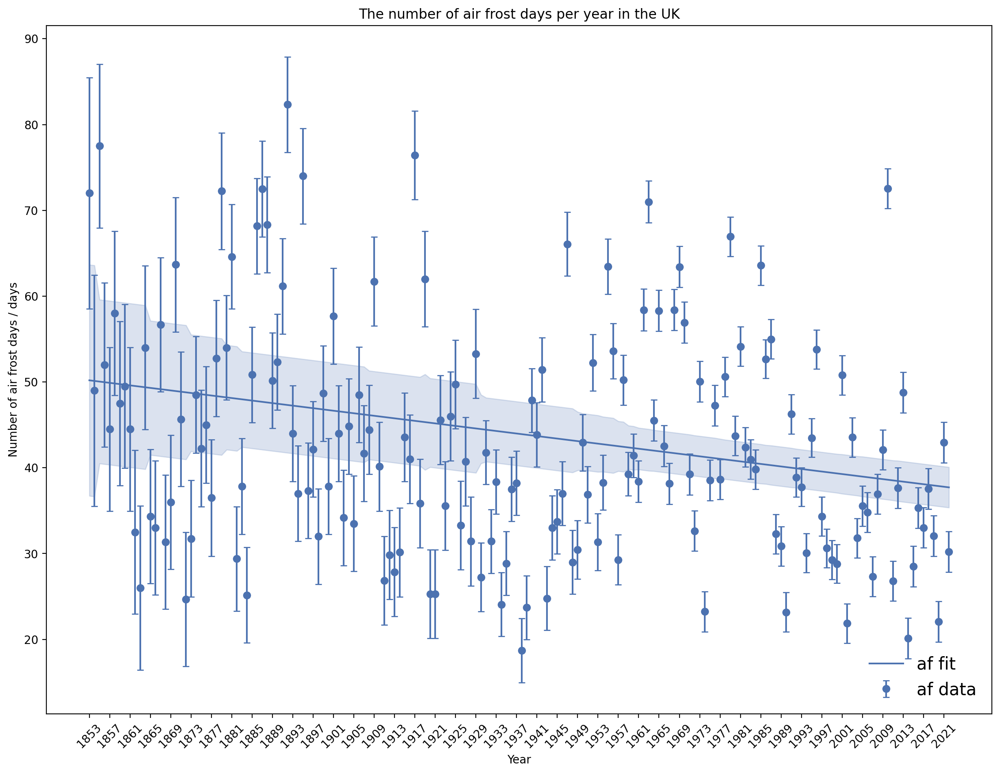

In [69]:
# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames_af = []

for file in data_files:
    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    #Preprocess the data
    df = preprocess_data(df, file)

    #Remove the first two rows
    df = df.iloc[2:]
    #Drop all columns other than the year, month and af
    df = df.drop(['tmax', 'tmin', 'rain', 'sun'], axis=1)
    #Convert the data type of the year and month columns to int
    #Drop missing values
    df = df.dropna()
    #COnvert all entries other than the header to numeric
    df = df.apply(pd.to_numeric, errors='coerce')
    #Drop all rows with missing values
    df = df.dropna()
    df['yyyy'] = df['yyyy'].astype(int)
    df['mm'] = df['mm'].astype(int)
    # #Convert the data type of the af column to float
    df['af'] = df['af'].astype(float)
    #Reset the index
    df = df.reset_index(drop=True)
    #Find the total number of af days per year
    df = df.groupby('yyyy').sum()
    #Reset the index
    df = df.reset_index()
    #Drop the month column
    df = df.drop(['mm'], axis=1)
    #Append the preprocessed data to the list
    data_frames_af.append(df)

#Concatenate all the dataframes in the list
combined_data_af = pd.concat(data_frames_af)

#Make a data frame for the year and the number of times it appears in the dataframe
df = pd.DataFrame(combined_data_af['yyyy'].value_counts())
#Rename the column
df = df.rename(columns={'yyyy': 'count'})
#Reset the index
df = df.reset_index()
#Rename the columns
df = df.rename(columns={'index': 'yyyy', 'count': 'count'})
#Sort the dataframe by year
df = df.sort_values(by=['yyyy'])
#Reset the index
df = df.reset_index(drop=True)

#Merge the two dataframes
combined_data_af = pd.merge(df, combined_data_af, on='yyyy')
combined_data_af = combined_data_af.groupby('yyyy').mean().reset_index()

#Fit a curve to the data
m = 1  #the degree of polynomial

size = len(combined_data_af)
x = combined_data_af['yyyy']

yaf = combined_data_af['af']


#define the function
def F(x, *theta):
    return sum([p * (x**i) for i, p in enumerate(theta)])


#Create a list of sigma values
#If station is before 1950, sigma = 0.1, if station is after 1950, sigma = 0.05
sigma_measurement = []
for i in range(len(combined_data_af)):
    if combined_data_af['yyyy'][i] < 1950:
        sigma_measurement.append(1)
    else:
        sigma_measurement.append(0.5)

#List of sigma_std_tmax, sigma_std_tmin and sigma_std_avgtemp
sigma_std_af = combined_data_af['af'].std() / (np.sqrt(
    combined_data_af['count']))

#Combine uncertainties in quadrature
sigma_af = np.sqrt(np.square(sigma_measurement) + np.square(sigma_std_af))

#Fit the curve
p0 = np.linspace(1, 1, m + 1)
thetaHat_af, cov_af = curve_fit(F,
                                x,
                                yaf,
                                p0,
                                sigma=sigma_af,
                                absolute_sigma=True)
xPlot = combined_data_af['yyyy']
fit_af = F(xPlot, *thetaHat_af)

#Print the values for the y intercept and the slope along with their uncertainties
print('af: y = ', thetaHat_af[0], ' +/- ', np.sqrt(cov_af[0, 0]))
print('af: m = ', thetaHat_af[1], ' +/- ', np.sqrt(cov_af[1, 1]))

#Plot the fitted curve with the standard deviation
plt.figure(figsize=(15, 11))
xPlot = combined_data_af['yyyy']
ticks = np.arange(min(xPlot), max(xPlot), 4)
plt.xticks(ticks, rotation=45)
plt.plot(combined_data_af['yyyy'], fit_af, 'b-', label=r'af fit')
#Fill the area between the curve and the standard deviation
plt.fill_between(combined_data_af['yyyy'],
                 fit_af - sigma_af,
                 fit_af + sigma_af,
                 color='b',
                 alpha=0.2)
plt.errorbar(combined_data_af['yyyy'],
             yaf,
             yerr=sigma_af,
             fmt='bo',
             label=r'af data',
             capsize=3)
plt.xlabel('Year')
plt.ylabel(r'Number of air frost days / days')
plt.title(r'The number of air frost days per year in the UK')
#Increase font size
plt.rcParams.update({'font.size': 15})
#Save figure as a pdf
plt.legend(loc='lower right', frameon=False)
plt.show()

#Reset rcParams
plt.rcParams.update(plt.rcParamsDefault)

Calculate the significance for the air frost rate of change  



In [70]:
from scipy import stats
from scipy.stats import norm

slope_uncertainty = np.sqrt(cov_af[1, 1])
slope = thetaHat_af[1]
z_value = slope / slope_uncertainty
p_value = stats.norm.cdf(-z_value) * 2

print('af:')
if p_value < 0.05:
    print("The slope is significantly different from 0 at the 5% level.")
else:
    print("The slope is not significantly different from 0 at the 5% level.")

#Print the Z value and the p value
print("Z value: ", z_value)

#Find the 95% confidence interval for the slope
slope_confidence_interval = stats.norm.interval(0.95,
                                                loc=slope,
                                                scale=slope_uncertainty)

#Print the 95% confidence interval for the slope
print("95% confidence interval for the slope: ", slope_confidence_interval)

af:
The slope is not significantly different from 0 at the 5% level.
Z value:  -10.973818218188743
95% confidence interval for the slope:  (-0.08700156692200876, -0.06063341952430297)


Make future predictions for the air frost variable  



In [71]:
std_fit_af = np.sqrt(np.diag(cov_af))
af_unc = np.sqrt(np.sum((std_fit_af)**2))

#Print in a table
table_af = pd.DataFrame(
    {
        f'days (+/- {af_unc.round(2)})': [
            F(1880, *thetaHat_af),
            F(1900, *thetaHat_af),
            F(2022, *thetaHat_af),
            F(2100, *thetaHat_af)
        ],
    },
    index=[1880, 1900, 2022, 2100])
table_af.index.name = 'Year'
table_af.columns.name = 'Air frost days'

#round all the values to 2 decimal places
table_af = table_af.round(2)
table_af

#Make a table of the increase in temperature using 1880 as a reference
#Find difference between each year and 1880
af_diff = table_af - table_af.loc[1880]

#Print the table
af_diff

Air frost days,days (+/- 13.27)
Year,
1880,0.00
1900,-1.48
2022,-10.48
2100,-16.24


Rain


rain: y =  -908.4179110848058  +/-  91.58181833752779
rain: m =  0.9027543567010842  +/-  0.04646494657254827


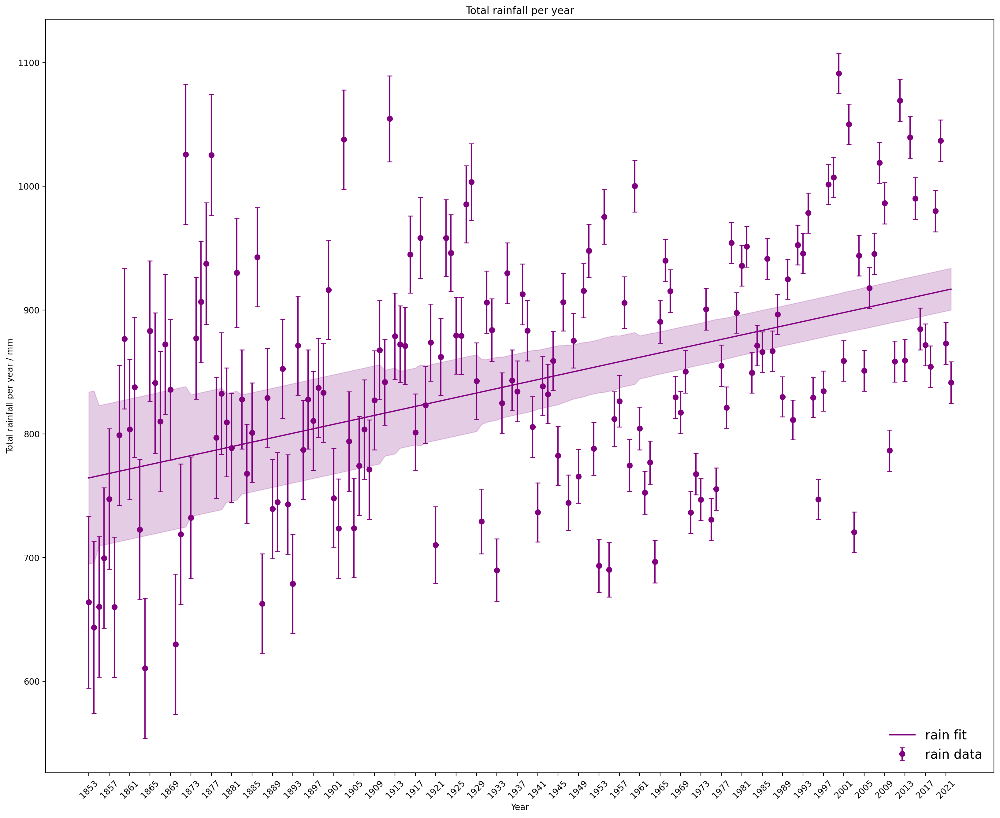

In [72]:
# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames_rain = []

for file in data_files:
    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    #Preprocess the data
    df = preprocess_data(df, file)

    #Remove the first two rows
    df = df.iloc[2:]
    #Drop all columns other than the year, month and af
    df = df.drop(['tmax', 'tmin', 'af', 'sun'], axis=1)
    #Convert the data type of the year and month columns to int
    #Drop missing values
    df = df.dropna()
    #Convert all entries other than the header to numeric
    df = df.apply(pd.to_numeric, errors='coerce')
    #Drop all rows with missing values
    df = df.dropna()
    df['yyyy'] = df['yyyy'].astype(int)
    df['mm'] = df['mm'].astype(int)
    # #Convert the data type of the af column to float
    df['rain'] = df['rain'].astype(float)
    #Reset the index
    df = df.reset_index(drop=True)
    #Find the total number of af days per year
    df = df.groupby('yyyy').sum()
    #Reset the index
    df = df.reset_index()
    #Drop the month column
    df = df.drop(['mm'], axis=1)
    # print(df)
    #Append the preprocessed data to the list
    data_frames_rain.append(df)

#Concatenate all the dataframes in the list
combined_data_rain = pd.concat(data_frames_rain)

#Make a data frame for the year and the number of times it appears in the dataframe
df = pd.DataFrame(combined_data_rain['yyyy'].value_counts())
#Rename the column
df = df.rename(columns={'yyyy': 'count'})
#Reset the index
df = df.reset_index()
#Rename the columns
df = df.rename(columns={'index': 'yyyy', 'count': 'count'})
#Sort the dataframe by year
df = df.sort_values(by=['yyyy'])
#Reset the index
df = df.reset_index(drop=True)

#Merge the two dataframes
combined_data_rain = pd.merge(df, combined_data_rain, on='yyyy')
combined_data_rain = combined_data_rain.groupby('yyyy').mean().reset_index()

#Fit a curve to the data
m = 1  #the degree of polynomial

size = len(combined_data_rain)
x = combined_data_rain['yyyy']

yrain = combined_data_rain['rain']


#define the function
def F(x, *theta):
    return sum([p * (x**i) for i, p in enumerate(theta)])


#Create a list of sigma values
#If station is before 1950, sigma = 0.1, if station is after 1950, sigma = 0.05
sigma_measurement = []
for i in range(len(combined_data_rain)):
    if combined_data_rain['yyyy'][i] < 1950:
        sigma_measurement.append(0.1)
    else:
        sigma_measurement.append(0.05)

#List of sigma_std_tmax, sigma_std_tmin and sigma_std_avgtemp
sigma_std_rain = combined_data_rain['rain'].std() / (np.sqrt(
    combined_data_rain['count']))

#Combine uncertainties in quadrature
sigma_rain = np.sqrt(np.square(sigma_measurement) + np.square(sigma_std_rain))

#Fit the curve
p0 = np.linspace(1, 1, m + 1)
thetaHat_rain, cov_rain = curve_fit(F,
                                    x,
                                    yrain,
                                    p0,
                                    sigma=sigma_rain,
                                    absolute_sigma=True)
xPlot = combined_data_rain['yyyy']
fit_rain = F(xPlot, *thetaHat_rain)

#Print the values for the y intercept and the slope along with their uncertainties
print('rain: y = ', thetaHat_rain[0], ' +/- ', np.sqrt(cov_rain[0, 0]))
print('rain: m = ', thetaHat_rain[1], ' +/- ', np.sqrt(cov_rain[1, 1]))

#Plot the fitted curve with the standard deviation
plt.figure(figsize=(20, 16))
xPlot = combined_data_rain['yyyy']
ticks = np.arange(min(xPlot), max(xPlot), 4)
plt.xticks(ticks, rotation=45)
plt.plot(combined_data_rain['yyyy'],
         fit_rain,
         '-',
         label=r'rain fit',
         color='purple')
#Fill the area between the curve and the standard deviation
plt.fill_between(combined_data_rain['yyyy'],
                 fit_rain - sigma_rain,
                 fit_rain + sigma_rain,
                 color='purple',
                 alpha=0.2)
plt.errorbar(combined_data_rain['yyyy'],
             yrain,
             yerr=sigma_rain,
             fmt='o',
             label=r'rain data',
             capsize=3,
             color='purple')
plt.xlabel('Year')
plt.ylabel(r'Total rainfall per year / mm')
plt.title('Total rainfall per year')
#Increase font size
plt.rcParams.update({'font.size': 15})
plt.legend(loc='lower right', frameon=False)
plt.show()

#Reset rcParams
plt.rcParams.update(plt.rcParamsDefault)

Calculate the significance for the rain rate of change  



In [73]:
slope_uncertainty = np.sqrt(cov_rain[1, 1])
slope = thetaHat_rain[1]
z_value = slope / slope_uncertainty
p_value = stats.norm.cdf(-z_value) * 2

print('rain:')
if p_value < 0.05:
    print("The slope is significantly different from 0 at the 5% level.")
else:
    print("The slope is not significantly different from 0 at the 5% level.")

#Print the Z value and the p value
print("Z value: ", z_value)

#Find the 95% confidence interval for the slope
slope_confidence_interval = stats.norm.interval(0.95,
                                                loc=slope,
                                                scale=slope_uncertainty)

#Print the 95% confidence interval for the slope
print("95% confidence interval for the slope: ", slope_confidence_interval)

rain:
The slope is significantly different from 0 at the 5% level.
Z value:  19.428718276724243
95% confidence interval for the slope:  (0.8116847348753118, 0.9938239785268566)


Make future predictions for the air frost variable  



In [74]:
#Predictions for the future
std_fit_rain = np.sqrt(np.diag(cov_rain))

rain_unc = np.sqrt(np.sum((std_fit_rain)**2))

#Print in a table
table_rain = pd.DataFrame(
    {
        f'mm (+/- {rain_unc.round(2)})': [
            F(1880, *thetaHat_rain),
            F(1900, *thetaHat_rain),
            F(2022, *thetaHat_rain),
            F(2100, *thetaHat_rain)
        ],
    },
    index=[1880, 1900, 2022, 2100])

table_rain.index.name = 'Year'
table_rain.columns.name = 'rain/mm'

#round all the values to 2 decimal places
table_rain = table_rain.round(2)

#Make a table of the increase in temperature using 1880 as a reference
#Find difference between each year and 1850
rain_diff = table_rain - table_rain.loc[1880]

#Print the table
rain_diff

rain/mm,mm (+/- 91.58)
Year,
1880,0.00
1900,18.06
2022,128.19
2100,198.61


Sun  



sun: y =  -935.3889141090762  +/-  172.06897061023005
sun: m =  1.1852316286259557  +/-  0.08702535948661702


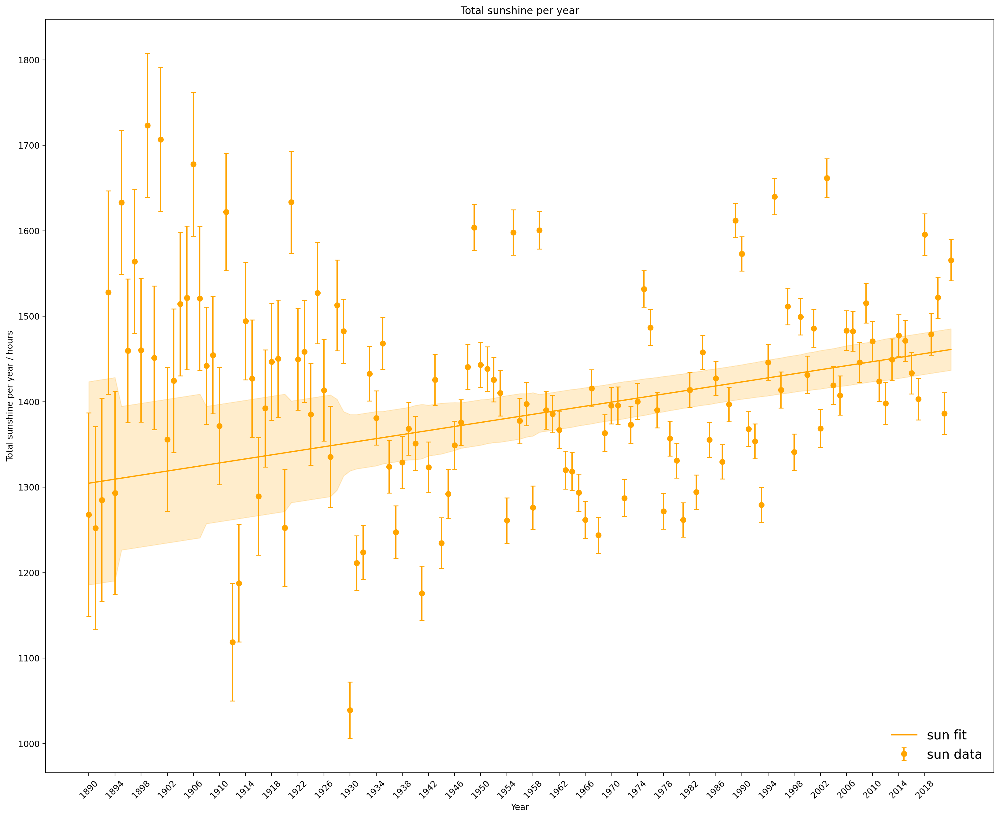

In [75]:
# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames_sun = []

for file in data_files:
    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    #Preprocess the data
    df = preprocess_data(df, file)

    #Remove the first two rows
    df = df.iloc[2:]
    #Drop all columns other than the year, month and af
    df = df.drop(['tmax', 'tmin', 'rain', 'af'], axis=1)
    #Convert the data type of the year and month columns to int
    #Drop missing values
    df = df.dropna()
    #Convert all entries other than the header to numeric
    df = df.apply(pd.to_numeric, errors='coerce')
    #Drop all rows with missing values
    df = df.dropna()
    df['yyyy'] = df['yyyy'].astype(int)
    df['mm'] = df['mm'].astype(int)
    # #Convert the data type of the af column to float
    df['sun'] = df['sun'].astype(float)
    #Reset the index
    df = df.reset_index(drop=True)
    #Find the total number of af days per year
    df = df.groupby('yyyy').sum()
    #Reset the index
    df = df.reset_index()
    #Drop the month column
    df = df.drop(['mm'], axis=1)
    #Append the preprocessed data to the list
    data_frames_sun.append(df)

#Concatenate all the dataframes in the list
combined_data_sun = pd.concat(data_frames_sun)

#Make a data frame for the year and the number of times it appears in the dataframe
df = pd.DataFrame(combined_data_sun['yyyy'].value_counts())
#Rename the column
df = df.rename(columns={'yyyy': 'count'})
#Reset the index
df = df.reset_index()
#Rename the columns
df = df.rename(columns={'index': 'yyyy', 'count': 'count'})
#Sort the dataframe by year
df = df.sort_values(by=['yyyy'])
#Reset the index
df = df.reset_index(drop=True)

#Merge the two dataframes
combined_data_sun = pd.merge(df, combined_data_sun, on='yyyy')
combined_data_sun = combined_data_sun.groupby('yyyy').mean().reset_index()

#Fit a curve to the data
m = 1  #the degree of polynomial

size = len(combined_data_sun)
x = combined_data_sun['yyyy']
# x = np.linspace(0, size, size)

ysun = combined_data_sun['sun']


#define the function
def F(x, *theta):
    return sum([p * (x**i) for i, p in enumerate(theta)])


#Create a list of sigma values
#If station is before 1950, sigma = 1, if station is after 1950, sigma = 0.5
sigma_measurement = []
for i in range(len(combined_data_sun)):
    if combined_data_sun['yyyy'][i] < 1950:
        sigma_measurement.append(1)
    else:
        sigma_measurement.append(0.5)

#List of sigma_std_tmax, sigma_std_tmin and sigma_std_avgtemp
sigma_std_sun = combined_data_sun['sun'].std() / (np.sqrt(
    combined_data_sun['count']))

#Combine uncertainties in quadrature
sigma_sun = np.sqrt(np.square(sigma_measurement) + np.square(sigma_std_sun))

#Fit the curve
p0 = np.linspace(1, 1, m + 1)
thetaHat_sun, cov_sun = curve_fit(F,
                                  x,
                                  ysun,
                                  p0,
                                  sigma=sigma_sun,
                                  absolute_sigma=True)
xPlot = combined_data_sun['yyyy']
fit_sun = F(xPlot, *thetaHat_sun)

#Print the values for the y intercept and the slope along with their uncertainties
print('sun: y = ', thetaHat_sun[0], ' +/- ', np.sqrt(cov_sun[0, 0]))
print('sun: m = ', thetaHat_sun[1], ' +/- ', np.sqrt(cov_sun[1, 1]))

#Plot the fitted curve with the standard deviation
plt.figure(figsize=(20, 16))
xPlot = combined_data_sun['yyyy']
ticks = np.arange(min(xPlot), max(xPlot), 4)
plt.xticks(ticks, rotation=45)
plt.plot(combined_data_sun['yyyy'],
         fit_sun,
         '-',
         label=r'sun fit',
         color='orange')
#Fill the area between the curve and the standard deviation
plt.fill_between(combined_data_sun['yyyy'],
                 fit_sun - sigma_sun,
                 fit_sun + sigma_sun,
                 color='orange',
                 alpha=0.2)
plt.errorbar(combined_data_sun['yyyy'],
             ysun,
             yerr=sigma_sun,
             fmt='o',
             label=r'sun data',
             capsize=3,
             color='orange')
plt.xlabel('Year')
plt.ylabel(r'Total sunshine per year / hours')
plt.title('Total sunshine per year')
#Increase font size
plt.rcParams.update({'font.size': 15})
plt.legend(loc='lower right', frameon=False)
plt.show()

#Reset rcParams
plt.rcParams.update(plt.rcParamsDefault)

Calculate the significance for the sun rate of change  



In [76]:
slope_uncertainty = np.sqrt(cov_sun[1, 1])
slope = thetaHat_sun[1]
z_value = slope / slope_uncertainty
p_value = stats.norm.cdf(-z_value) * 2

print('sun:')
if p_value < 0.05:
    print("The slope is significantly different from 0 at the 5% level.")
else:
    print("The slope is not significantly different from 0 at the 5% level.")

#Print the Z value and the p value
print("Z value: ", z_value)

#Find the 95% confidence interval for the slope
slope_confidence_interval = stats.norm.interval(0.95,
                                                loc=slope,
                                                scale=slope_uncertainty)

#Print the 95% confidence interval for the slope
print("95% confidence interval for the slope: ", slope_confidence_interval)

sun:
The slope is significantly different from 0 at the 5% level.
Z value:  13.619382161911362
95% confidence interval for the slope:  (1.0146650582905352, 1.355798198961376)


Make future predictions for the air frost variable  



In [77]:
std_fit_sun = np.sqrt(np.diag(cov_sun))
sun_unc = np.sqrt(np.sum((std_fit_sun)**2))

#Print in a table
table_sun = pd.DataFrame(
    {
        f'mm (+/- {sun_unc.round(2)})': [
            F(1880, *thetaHat_sun),
            F(1900, *thetaHat_sun),
            F(2022, *thetaHat_sun),
            F(2100, *thetaHat_sun)
        ],
    },
    index=[1880, 1900, 2022, 2100])

table_sun.index.name = 'Year'
table_sun.columns.name = 'sun/hours'

#round all the values to 2 decimal places
table_sun = table_sun.round(2)

#Make a table of the increase in temperature using 1880 as a reference
#Find difference between each year and 1850
sun_diff = table_sun - table_sun.loc[1880]

#Print the table
sun_diff

sun/hours,mm (+/- 172.07)
Year,
1880,0.00
1900,23.70
2022,168.30
2100,260.75


Now we will look at th significance of the year 2022 with respect to all of the historic data  



First, rank the top 5 years with the highest temperatures  



The top 5 years with the highest average temperature and their average temperature are: 
     yyyy    avgtemp
12   1865  10.978704
169  2022  10.850368
4    1857  10.793750
15   1868  10.791667
161  2014  10.622181 

The top 5 years with the highest tmax and their tmax are: 
     yyyy       tmax
12   1865  14.964815
15   1868  14.838889
4    1857  14.766667
6    1859  14.541667
169  2022  14.518382 

The top 5 years with the highest tmin and their tmin are: 
     yyyy      tmin
161  2014  7.186029
169  2022  7.182353
12   1865  6.992593
164  2017  6.925735
149  2002  6.918652


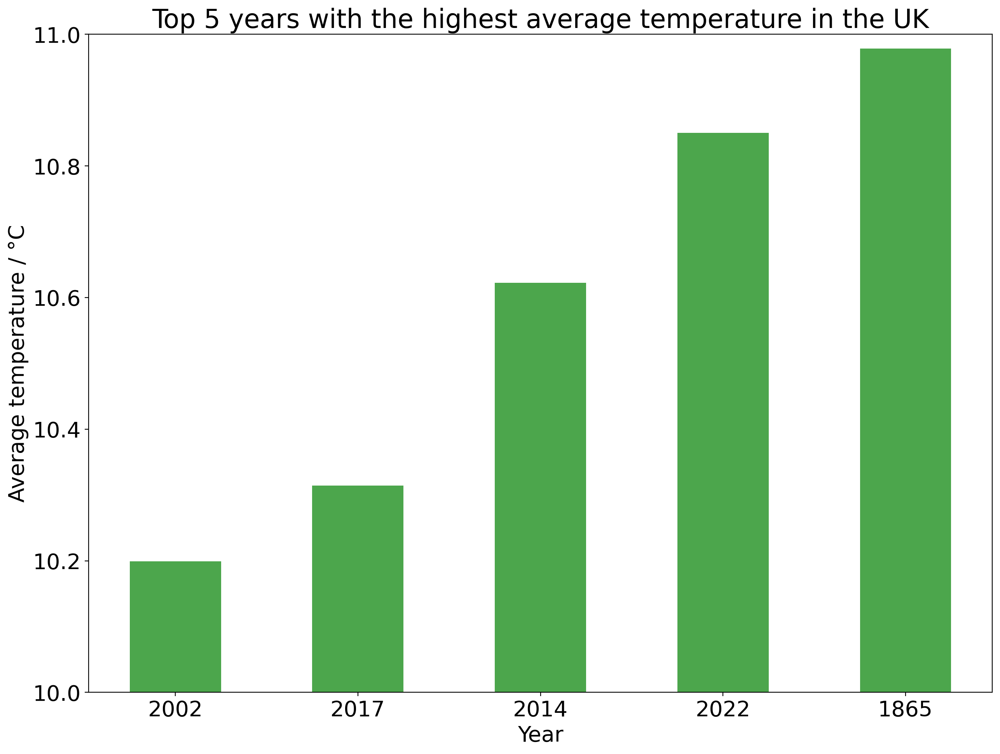

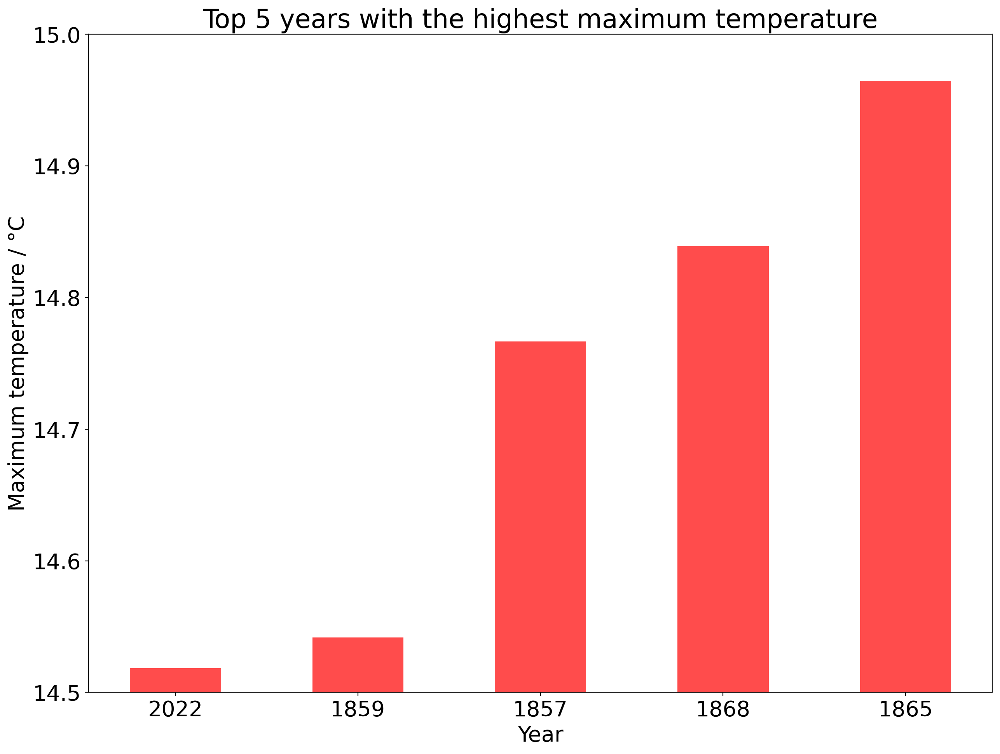

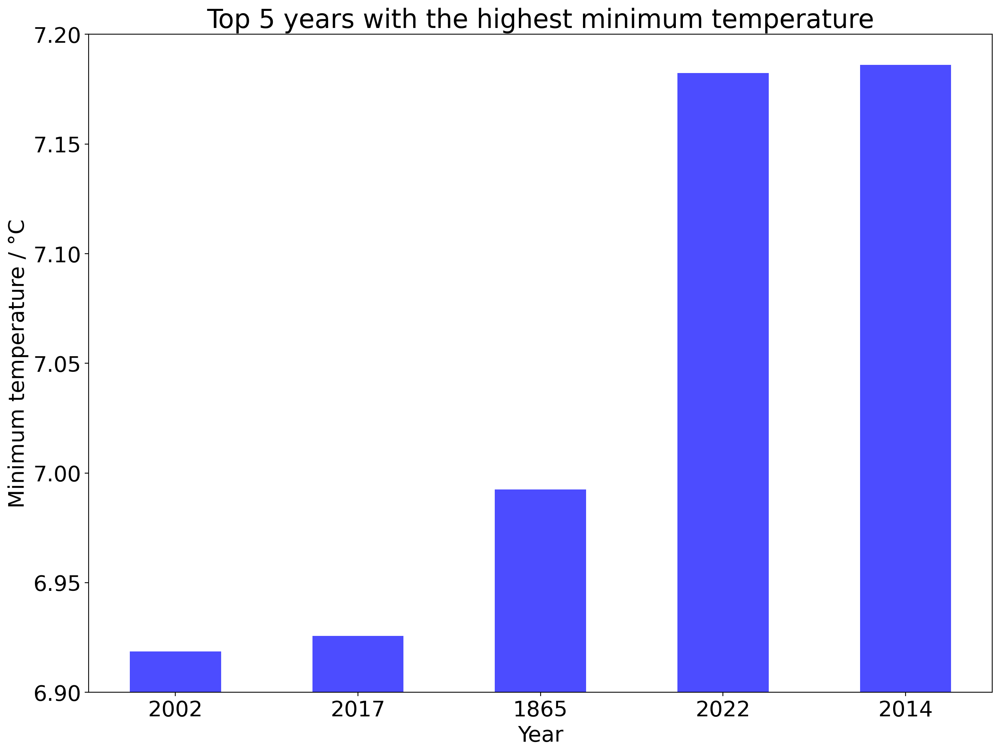

In [78]:
#List the top 5 years with the highest average temperature and their average temperature and display in a table
combined_data_tavg_sorted = combined_data_tavg.sort_values(by=['avgtemp'],
                                                           ascending=False)
print(
    'The top 5 years with the highest average temperature and their average temperature are: '
)
print(combined_data_tavg_sorted[['yyyy', 'avgtemp']].head(5), '\n')

#List the top 5 years with the highest tmax and their tmax and display in a table
combined_data_tavg_sorted = combined_data_tavg.sort_values(by=['tmax'],
                                                           ascending=False)
print('The top 5 years with the highest tmax and their tmax are: ')
print(combined_data_tavg_sorted[['yyyy', 'tmax']].head(5), '\n')

#List the top 5 years with the highest tmin and their tmin and display in a table
combined_data_tavg_sorted = combined_data_tavg.sort_values(by=['tmin'],
                                                           ascending=False)
print('The top 5 years with the highest tmin and their tmin are: ')
print(combined_data_tavg_sorted[['yyyy', 'tmin']].head(5))

#Create a new dataframe with the top 5 years with the highest average temperature
combined_data_tavg_sorted_top5 = combined_data_tavg_sorted.head(5)

#Ensure the dataframe is sorted from lowest to highest temperature
combined_data_tavg_sorted_top5 = combined_data_tavg_sorted_top5.sort_values(
    by=['avgtemp'], ascending=True)

#Set font size
plt.rcParams.update({'font.size': 20})

#Create bar chart with equally spaced x values
plt.figure(figsize=(15, 11))
x = np.arange(len(combined_data_tavg_sorted_top5['yyyy']))
plt.bar(x,
        combined_data_tavg_sorted_top5['avgtemp'],
        width=0.5,
        color='green',
        alpha=0.7)
plt.xticks(x, combined_data_tavg_sorted_top5['yyyy'])
#Zoom in on the y axis
plt.ylim(10, 11)
plt.xlabel('Year')
plt.ylabel('Average temperature / °C')
plt.title('Top 5 years with the highest average temperature in the UK')
#Increase font size
plt.show()

#Do this for the top 5 years with the highest tmax
#List the top 5 years with the highest maximum temperature and their maximum temperature and display in a table
combined_data_tmax_sorted = combined_data_tavg.sort_values(by=['tmax'],
                                                           ascending=False)

#Create a new dataframe with the top 5 years with the highest maximum temperature
combined_data_tmax_sorted_top5 = combined_data_tmax_sorted.head(5)

#Ensure the dataframe is sorted from lowest to highest temperature
combined_data_tmax_sorted_top5 = combined_data_tmax_sorted_top5.sort_values(
    by=['tmax'], ascending=True)

#Create bar chart with equally spaced x values
plt.figure(figsize=(15, 11))
x = np.arange(len(combined_data_tmax_sorted_top5['yyyy']))
plt.bar(x,
        combined_data_tmax_sorted_top5['tmax'],
        width=0.5,
        color='red',
        alpha=0.7)
plt.xticks(x, combined_data_tmax_sorted_top5['yyyy'])
#Zoom in on the y axis
plt.ylim(14.5, 15)
plt.xlabel('Year')
plt.ylabel('Maximum temperature / °C')
plt.title('Top 5 years with the highest maximum temperature')
#Increase font size
plt.show()

#Do this for the top 5 years with the highest tmin
#List the top 5 years with the highest minimum temperature and their minimum temperature and display in a table
combined_data_tmin_sorted = combined_data_tavg.sort_values(by=['tmin'],
                                                           ascending=False)

#Create a new dataframe with the top 5 years with the highest minimum temperature
combined_data_tmin_sorted_top5 = combined_data_tmin_sorted.head(5)

#Ensure the dataframe is sorted from lowest to highest temperature
combined_data_tmin_sorted_top5 = combined_data_tmin_sorted_top5.sort_values(
    by=['tmin'], ascending=True)

#Create bar chart with equally spaced x values
plt.figure(figsize=(15, 11))
x = np.arange(len(combined_data_tmin_sorted_top5['yyyy']))
plt.bar(x,
        combined_data_tmin_sorted_top5['tmin'],
        width=0.5,
        color='blue',
        alpha=0.7)
plt.xticks(x, combined_data_tmin_sorted_top5['yyyy'])
#Zoom in on the y axis
plt.ylim(6.9, 7.2)
plt.xlabel('Year')
plt.ylabel('Minimum temperature / °C')
plt.title('Top 5 years with the highest minimum temperature')
#Increase font size
plt.show()

Now, we will produce distributions of each of the weather variables and compare the mean of the distributions to the 2022 values. For the temperature, we find the significance of the maximum average temperature 2022 value, whereas we compare the average 2022 value for the other weather variables.   



In [79]:
# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames_avg = []

for file in data_files:

    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])
    df = df.dropna()
    #Preprocess the data
    df = preprocess_data(df, file)

    #Remove the first two rows
    df = df.iloc[2:]
    #Drop all columns other than the year, month, tmax and tmin
    df = df.drop(['af', 'rain', 'sun'], axis=1)
    #Convert the data type of the year and month columns to int
    #COnvert all entries other than the header to numeric
    df = df.apply(pd.to_numeric, errors='coerce')
    #Drop all rows with missing values
    df = df.dropna()
    df['yyyy'] = df['yyyy'].astype(int)
    df['mm'] = df['mm'].astype(int)
    # #Convert the data type of the tmax and tmin columns to float
    df['tmax'] = df['tmax'].astype(float)
    df['tmin'] = df['tmin'].astype(float)
    #Calculate the average temperature
    df['avgtemp'] = (df['tmax'] + df['tmin']) / 2
    #Reset the index
    df = df.reset_index(drop=True)
    #Find the average temperature for each year
    df = df.groupby('yyyy').mean()
    #Reset the index
    df = df.reset_index()

    #Append the preprocessed data to the list
    data_frames_avg.append(df)

#Concatenate all the dataframes in the list
combined_data_tavg = pd.concat(data_frames_avg)
#drop month column
combined_data_tavg = combined_data_tavg.drop(['mm'], axis=1)
combined_data_tavg

,yyyy,tmax,tmin,avgtemp
0,1961,12.636364,5.509091,9.072727
1,1962,11.050000,3.658333,7.354167
2,1963,10.916667,3.716667,7.316667
3,1964,11.666667,4.816667,8.241667
4,1965,11.158333,3.975000,7.566667
...,...,...,...,...
88,2018,13.708333,6.300000,10.004167
89,2019,13.866667,6.575000,10.220833
90,2020,13.950000,6.475000,10.212500
91,2021,14.058333,6.700000,10.379167


/tmp/ipykernel_255/1156612879.py:37: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.1, 0.1, 0.1, 1)). The keyword argument will take precedence.
  ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')


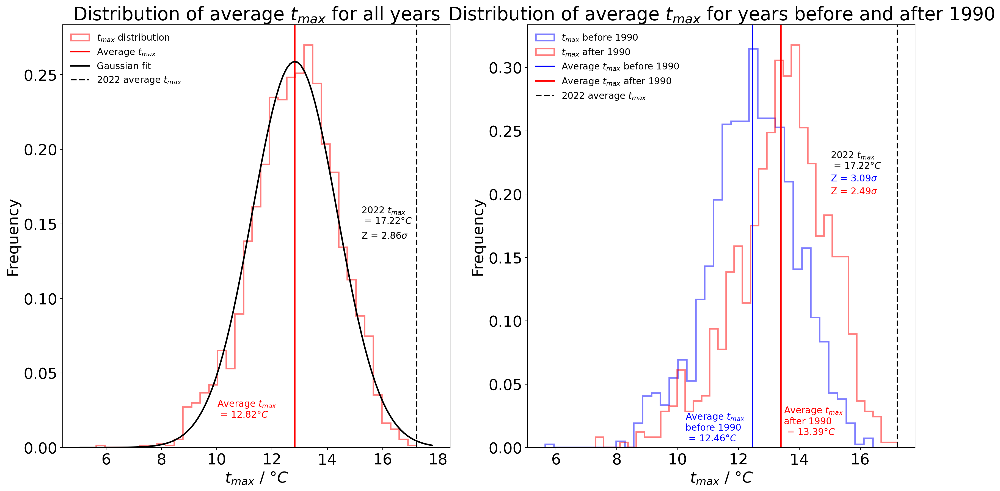

In [80]:
#Isolate the data for 2022
mask = combined_data_tavg['yyyy'] == 2022
df_2022 = combined_data_tavg[mask]
#Calculate the average tmax for 2022
# tmax_2022 = df_2022['tmax'].mean()
tmax_2022 = combined_data_tavg.sort_values(
    by='tmax', ascending=False).head(1)['tmax'].values[0]
# tmax_2022 = df_2022['tmax'].values[0]

#Fit a normal distribution to the data
mu, std = norm.fit(combined_data_tavg['tmax'])

#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax
Z_tmax = (tmax_2022 - mu) / std

#Place these two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.hist(combined_data_tavg['tmax'],
         bins=37,
         color='red',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{max}$ distribution',
         histtype='step')
ax1.axvline(mu, color='red', linewidth=2, label=r'Average $t_{max}$')
#Indicate the value for mu on the plot
ax1.text(mu - 2.8,
         0.02,
         r'Average $t_{max}$' + '\n = {:.2f}$\degree C$'.format(mu),
         fontsize=12,
         color='red')
#Plot the normal distribution
xmin, xmax = ax1.get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')
ax1.axvline(tmax_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label=r'2022 average $t_{max}$')
#Indicate the value for 2022 on the plot
ax1.text(tmax_2022 - 2,
         0.15,
         r'2022 $t_{max}$' + '\n = {:.2f}$\degree C$'.format(tmax_2022),
         fontsize=12,
         color='black')
ax1.text(tmax_2022 - 2,
         0.14,
         r'Z = {:.2f}$\sigma$'.format(Z_tmax),
         fontsize=12,
         color='black')
ax1.set_xlabel(r'$t_{max}$ / $\degree C$')
ax1.set_ylabel('Frequency')
ax1.set_title(r'Distribution of average $t_{max}$ for all years')
# ax1.legend(frameon=False)
#Reduce size of legend and remove frame
ax1.legend(frameon=False, fontsize=12, loc='upper left')

#Split the data into before and after 1990
mask = combined_data_tavg['yyyy'] < 1990
combined_data_before = combined_data_tavg[mask]
mask = combined_data_tavg['yyyy'] >= 1990
combined_data_after = combined_data_tavg[mask]

#Calculate the average tmax for before and after 1990
tmax_before = combined_data_before['tmax'].mean()
tmax_after = combined_data_after['tmax'].mean()

ax2.hist(combined_data_before['tmax'],
         bins=37,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{max}$ before 1990',
         histtype='step')
ax2.hist(combined_data_after['tmax'],
         bins=37,
         color='red',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{max}$ after 1990',
         histtype='step')
ax2.axvline(tmax_before,
            color='blue',
            linewidth=2,
            label=r'Average $t_{max}$ before 1990')
#Indicate the value for mu on the plot
ax2.text(tmax_before - 2.2,
         0.005,
         r'Average $t_{max}$' +
         '\nbefore 1990\n = {:.2f}$\degree C$'.format(tmax_before),
         fontsize=12,
         color='blue')
ax2.axvline(tmax_after,
            color='red',
            linewidth=2,
            label=r'Average $t_{max}$ after 1990')
#Indicate the value for mu on the plot
ax2.text(tmax_after + 0.1,
         0.01,
         r'Average $t_{max}$' +
         '\nafter 1990\n = {:.2f}$\degree C$'.format(tmax_after),
         fontsize=12,
         color='red')
ax2.axvline(tmax_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label=r'2022 average $t_{max}$')
#Indicate the value for 2022 on the plot
ax2.text(tmax_2022 - 2.2,
         0.22,
         r'2022 $t_{max}$' + '\n = {:.2f}$\degree C$'.format(tmax_2022),
         fontsize=12,
         color='black')
#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax with respect to the average tmax before 1990
Z_tmax_wrt_before = (tmax_2022 - tmax_before) / std
ax2.text(tmax_2022 - 2.2,
         0.21,
         r'Z = {:.2f}$\sigma$'.format(Z_tmax_wrt_before),
         fontsize=12,
         color='blue')
#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax with respect to the average tmax after 1990
Z_tmax_wrt_after = (tmax_2022 - tmax_after) / std
ax2.text(tmax_2022 - 2.2,
         0.2,
         r'Z = {:.2f}$\sigma$'.format(Z_tmax_wrt_after),
         fontsize=12,
         color='red')

ax2.set_xlabel(r'$t_{max}$ / $\degree C$')
ax2.set_ylabel('Frequency')
ax2.set_title(
    r'Distribution of average $t_{max}$ for years before and after 1990')
ax2.legend(frameon=False, fontsize=12, loc='upper left')
# plt.savefig('tmaxdist.pdf', bbox_inches='tight', format='pdf')
plt.show()

/tmp/ipykernel_255/1077941513.py:37: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.1, 0.1, 0.1, 1)). The keyword argument will take precedence.
  ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')


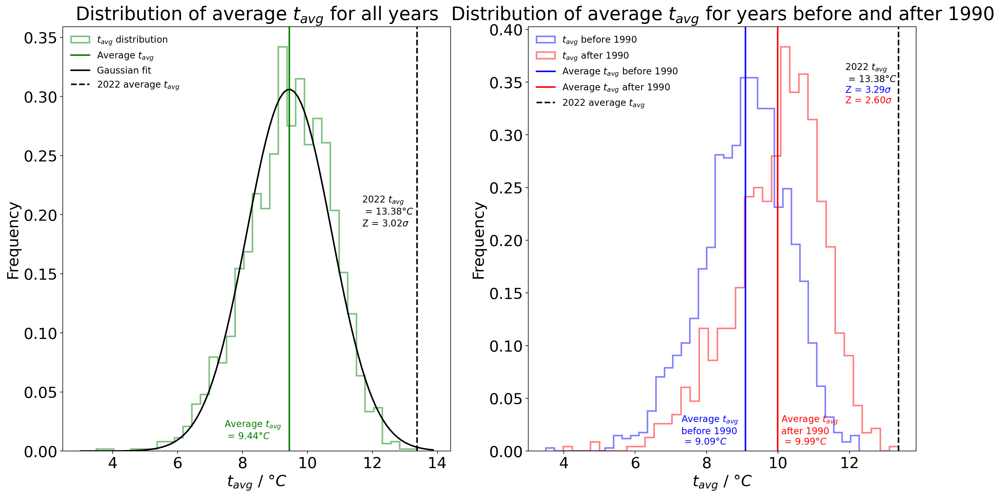

In [81]:
#Isolate the data for 2022
mask = combined_data_tavg['yyyy'] == 2022
df_2022 = combined_data_tavg[mask]
#Calculate the average tmax for 2022
# tavg_2022 = df_2022['avgtemp'].mean()
tavg_2022 = combined_data_tavg.sort_values(
    by='avgtemp', ascending=False).head(1)['avgtemp'].values[0]
# tmax_2022 = df_2022['tmax'].values[0]

#Fit a normal distribution to the data
mu, std = norm.fit(combined_data_tavg['avgtemp'])

#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax
Z_tavg = (tavg_2022 - mu) / std

#Place these two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.hist(combined_data_tavg['avgtemp'],
         bins=37,
         color='green',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{avg}$ distribution',
         histtype='step')
ax1.axvline(mu, color='green', linewidth=2, label=r'Average $t_{avg}$')
#Indicate the value for mu on the plot
ax1.text(mu - 2,
         0.01,
         r'Average $t_{avg}$' + '\n = {:.2f}$\degree C$'.format(mu),
         fontsize=12,
         color='green')
#Plot the normal distribution
xmin, xmax = ax1.get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')
ax1.axvline(tavg_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label=r'2022 average $t_{avg}$')
#Indicate the value for 2022 on the plot
ax1.text(tavg_2022 - 1.7,
         0.2,
         r'2022 $t_{avg}$' + '\n = {:.2f}$\degree C$'.format(tavg_2022),
         fontsize=12,
         color='black')
ax1.text(tavg_2022 - 1.7,
         0.19,
         r'Z = {:.2f}$\sigma$'.format(Z_tavg),
         fontsize=12,
         color='black')
ax1.set_xlabel(r'$t_{avg}$ / $\degree C$')
ax1.set_ylabel('Frequency')
ax1.set_title(r'Distribution of average $t_{avg}$ for all years')
#Reduce size of legend and remove frame
ax1.legend(frameon=False, fontsize=12, loc='upper left')

#Split the data into before and after 1990
mask = combined_data_tavg['yyyy'] < 1990
combined_data_before = combined_data_tavg[mask]
mask = combined_data_tavg['yyyy'] >= 1990
combined_data_after = combined_data_tavg[mask]

#Calculate the average tmax for before and after 1990
tavg_before = combined_data_before['avgtemp'].mean()
tavg_after = combined_data_after['avgtemp'].mean()

ax2.hist(combined_data_before['avgtemp'],
         bins=37,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{avg}$ before 1990',
         histtype='step')
ax2.hist(combined_data_after['avgtemp'],
         bins=37,
         color='red',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{avg}$ after 1990',
         histtype='step')
ax2.axvline(tavg_before,
            color='blue',
            linewidth=2,
            label=r'Average $t_{avg}$ before 1990')
#Indicate the value for mu on the plot
ax2.text(tavg_before - 1.8,
         0.006,
         r'Average $t_{avg}$' +
         '\nbefore 1990\n = {:.2f}$\degree C$'.format(tavg_before),
         fontsize=12,
         color='blue')
ax2.axvline(tavg_after,
            color='red',
            linewidth=2,
            label=r'Average $t_{avg}$ after 1990')
#Indicate the value for mu on the plot
ax2.text(tavg_after + 0.1,
         0.006,
         r'Average $t_{avg}$' +
         '\nafter 1990\n = {:.2f}$\degree C$'.format(tavg_after),
         fontsize=12,
         color='red')
ax2.axvline(tavg_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label=r'2022 average $t_{avg}$')
#Indicate the value for 2022 on the plot
ax2.text(tavg_2022 - 1.5,
         0.35,
         r'2022 $t_{avg}$' + '\n = {:.2f}$\degree C$'.format(tavg_2022),
         fontsize=12,
         color='black')
#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax with respect to the average tmax before 1990
Z_tavg_wrt_before = (tavg_2022 - tavg_before) / std
ax2.text(tavg_2022 - 1.5,
         0.34,
         r'Z = {:.2f}$\sigma$'.format(Z_tavg_wrt_before),
         fontsize=12,
         color='blue')
#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax with respect to the average tmax after 1990
Z_tavg_wrt_after = (tavg_2022 - tavg_after) / std
ax2.text(tavg_2022 - 1.5,
         0.33,
         r'Z = {:.2f}$\sigma$'.format(Z_tavg_wrt_after),
         fontsize=12,
         color='red')

ax2.set_xlabel(r'$t_{avg}$ / $\degree C$')
ax2.set_ylabel('Frequency')
ax2.set_title(
    r'Distribution of average $t_{avg}$ for years before and after 1990')
ax2.legend(frameon=False, fontsize=12, loc='upper left')
# plt.savefig('tavgdist.pdf', bbox_inches='tight', format='pdf')
plt.show()

/tmp/ipykernel_255/3154584730.py:37: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.1, 0.1, 0.1, 1)). The keyword argument will take precedence.
  ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')


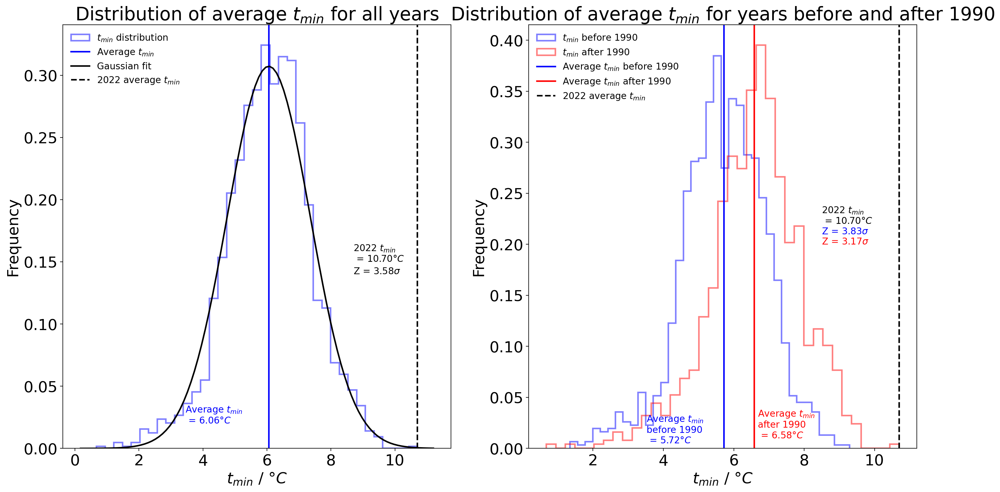

In [82]:
#Isolate the data for 2022
mask = combined_data_tavg['yyyy'] == 2022
df_2022 = combined_data_tavg[mask]
#Calculate the average tmax for 2022
# tmax_2022 = df_2022['tmax'].mean()
tmin_2022 = combined_data_tavg.sort_values(
    by='tmin', ascending=False).head(1)['tmin'].values[0]
# tmax_2022 = df_2022['tmax'].values[0]

#Fit a normal distribution to the data
mu, std = norm.fit(combined_data_tavg['tmin'])

#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax
Z_tmin = (tmin_2022 - mu) / std

#Place these two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.hist(combined_data_tavg['tmin'],
         bins=37,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{min}$ distribution',
         histtype='step')
ax1.axvline(mu, color='blue', linewidth=2, label=r'Average $t_{min}$')
#Indicate the value for mu on the plot
ax1.text(mu - 2.6,
         0.02,
         r'Average $t_{min}$' + '\n = {:.2f}$\degree C$'.format(mu),
         fontsize=12,
         color='blue')
#Plot the normal distribution
xmin, xmax = ax1.get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')
ax1.axvline(tmin_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label=r'2022 average $t_{min}$')
#Indicate the value for 2022 on the plot
ax1.text(tmin_2022 - 2,
         0.15,
         r'2022 $t_{min}$' + '\n = {:.2f}$\degree C$'.format(tmin_2022),
         fontsize=12,
         color='black')
ax1.text(tmin_2022 - 2,
         0.14,
         r'Z = {:.2f}$\sigma$'.format(Z_tmin),
         fontsize=12,
         color='black')
ax1.set_xlabel(r'$t_{min}$ / $\degree C$')
ax1.set_ylabel('Frequency')
ax1.set_title(r'Distribution of average $t_{min}$ for all years')
# ax1.legend(frameon=False)
#Reduce size of legend and remove frame
ax1.legend(frameon=False, fontsize=12, loc='upper left')

#Split the data into before and after 1990
mask = combined_data_tavg['yyyy'] < 1990
combined_data_before = combined_data_tavg[mask]
mask = combined_data_tavg['yyyy'] >= 1990
combined_data_after = combined_data_tavg[mask]

#Calculate the average tmax for before and after 1990
tmin_before = combined_data_before['tmin'].mean()
tmin_after = combined_data_after['tmin'].mean()

ax2.hist(combined_data_before['tmin'],
         bins=37,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{min}$ before 1990',
         histtype='step')
ax2.hist(combined_data_after['tmin'],
         bins=37,
         color='red',
         linewidth=2,
         density=True,
         alpha=0.5,
         label=r'$t_{min}$ after 1990',
         histtype='step')
ax2.axvline(tmin_before,
            color='blue',
            linewidth=2,
            label=r'Average $t_{min}$ before 1990')
#Indicate the value for mu on the plot
ax2.text(tmin_before - 2.2,
         0.005,
         r'Average $t_{min}$' +
         '\nbefore 1990\n = {:.2f}$\degree C$'.format(tmin_before),
         fontsize=12,
         color='blue')
ax2.axvline(tmin_after,
            color='red',
            linewidth=2,
            label=r'Average $t_{min}$ after 1990')
#Indicate the value for mu on the plot
ax2.text(tmin_after + 0.1,
         0.01,
         r'Average $t_{min}$' +
         '\nafter 1990\n = {:.2f}$\degree C$'.format(tmin_after),
         fontsize=12,
         color='red')
ax2.axvline(tmin_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label=r'2022 average $t_{min}$')
#Indicate the value for 2022 on the plot
ax2.text(tmin_2022 - 2.2,
         0.22,
         r'2022 $t_{min}$' + '\n = {:.2f}$\degree C$'.format(tmin_2022),
         fontsize=12,
         color='black')
#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax with respect to the average tmax before 1990
Z_tmin_wrt_before = (tmin_2022 - tmin_before) / std
ax2.text(tmin_2022 - 2.2,
         0.21,
         r'Z = {:.2f}$\sigma$'.format(Z_tmin_wrt_before),
         fontsize=12,
         color='blue')
#Calculate the significance of the average tmax for 2022 using Z_tmax = (tmax_2022 - mu_tmax)/std_tmax with respect to the average tmax after 1990
Z_tmin_wrt_after = (tmin_2022 - tmin_after) / std
ax2.text(tmin_2022 - 2.2,
         0.2,
         r'Z = {:.2f}$\sigma$'.format(Z_tmin_wrt_after),
         fontsize=12,
         color='red')

ax2.set_xlabel(r'$t_{min}$ / $\degree C$')
ax2.set_ylabel('Frequency')
ax2.set_title(
    r'Distribution of average $t_{min}$ for years before and after 1990')
ax2.legend(frameon=False, fontsize=12, loc='upper left')
# plt.savefig('tmindist.pdf', bbox_inches='tight', format='pdf')
plt.show()

Reload in the data for af and rain  



In [83]:
def preprocess_data(data, file):
    # Split the string values on whitespace and take the first value
    data = data.apply(lambda x: x.str.split().str[0]
                      if x.dtype == object else x)
    # Removing spaces
    data = data.apply(lambda x: x.str.strip() if x.dtype == object else x)
    data.replace(to_replace='---', value=np.nan, inplace=True, regex=True)

    # Remove rows with missing values
    data = data.dropna()

    return data


def nominal_case(data):

    all_years = []
    all_tmax = []
    all_tmin = []
    all_af = []
    all_rain = []
    # all_sun = []

    # find all the years
    year = data['yyyy']

    # find all the unique years
    unique_year = year.unique()

    # for each unique year
    for year in unique_year:
        # find all the rows with that year
        mask = df['yyyy'] == year

        # get a new dataframe with only that year
        df_year = df[mask]
        if len(df_year) == 12:

            # create a list to append the summer tmax
            summer_tmax = []

            # find the next year
            int_year = int(year)
            next_year = int_year + 1
            next_year = str(next_year)
            mask2 = df['yyyy'] == next_year
            df_next_year = df[mask2]

            # for each month in the summer
            for month in range(6, 9):
                month2 = str(month)

                # find all the rows with that month
                month_mask = df_year['mm'] == month2

                # get a new dataframe with only that month
                temp = df_year[month_mask]

                if temp.empty:
                    continue
                else:
                    answer = temp['tmax'].values
                    # append the tmax to the list
                    summer_tmax.append(float(answer))
            # find the average of the summer tmax
            summer_tmax_avg = np.mean(summer_tmax)

            # create a list to append the winter tmin
            winter_tmin = []

            # for each month in the winter
            for month in range(1, 3):
                month2 = str(month)

                # find all the rows with that month
                month_mask = df_next_year['mm'] == month2

                # get a new dataframe with only that month
                temp = df_next_year[month_mask]

                if temp.empty:
                    continue
                else:
                    answer = temp['tmin'].values
                    #append the tmin to list
                    winter_tmin.append(float(answer))

            # add the month of december
            month_mask = df_year['mm'] == '12'
            temp = df_year[month_mask]
            answer = temp['tmin'].values
            winter_tmin.append(float(answer))

            # find the average of the winter tmin
            winter_tmin_avg = np.mean(winter_tmin)

            # find the number of days with air frost
            af = list(map(float, df_year['af'].values))
            af_sum = np.sum(af)
            rain = list(map(float, df_year['rain'].values))
            rain_sum = np.sum(rain)

            sun = list(map(float, df_year['sun'].values))
            sun_sum = np.sum(sun)

            all_years.append(year)
            all_tmax.append(summer_tmax_avg)
            all_tmin.append(winter_tmin_avg)
            all_af.append(af_sum)
            all_rain.append(rain_sum)
            # all_sun.append(sun_sum)

    big_dataframe = pd.DataFrame(
        data={
            'yyyy': all_years,
            'tmax': all_tmax,
            'tmin': all_tmin,
            'af': all_af,
            'rain': all_rain
        })
    return big_dataframe


# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames = []

# Iterate over the data files
for file in data_files:
    #Print 'Loading file: ' followed by the filename
    print('Loading file: ' + file)

    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    # Keep only the rows with actual data (skip the first row with units)
    df = df.iloc[2:]

    # Preprocess the data
    df = preprocess_data(df, file)

    # Calculate nominal case
    df = nominal_case(df)

    # Append the preprocessed data to the list
    data_frames.append(df)

# Concatenate the DataFrames into a single dataset
combined_data = pd.concat(data_frames)

#Convert the year column to an integer
combined_data['yyyy'] = combined_data['yyyy'].astype(int)

combined_data

Loading file: Ballypatrick_data_CLEANED.csv
Loading file: Newtonrigg_data_CLEANED.csv
Loading file: Nairn_data_CLEANED.csv
Loading file: Suttonbonington_data_CLEANED.csv
Loading file: Ringway_data_CLEANED.csv
Loading file: Southampton_data_CLEANED.csv
Loading file: Durham_data_CLEANED.csv
Loading file: Paisley_data_CLEANED.csv
Loading file: Lerwick_data_CLEANED.csv
Loading file: Sheffield_data_CLEANED.csv
Loading file: Shawbury_data_CLEANED.csv
Loading file: Yeovilton_data_CLEANED.csv
Loading file: Aberporth_data_CLEANED.csv
Loading file: Lowestoft_data_CLEANED.csv
Loading file: Stornoway_data_CLEANED.csv
Loading file: Camborne_data_CLEANED.csv
Loading file: Heathrow_data_CLEANED.csv
Loading file: Tiree_data_CLEANED.csv
Loading file: Waddington_data_CLEANED.csv
Loading file: Whitby_data_CLEANED.csv
Loading file: Manston_data_CLEANED.csv
Loading file: Cardiff_data_CLEANED.csv
Loading file: Oxford_data_CLEANED.csv
Loading file: Wickairport_data_CLEANED.csv
Loading file: Cwmystwyth_data_C

,yyyy,tmax,tmin,af,rain
0,1961,16.766667,-0.833333,48.0,911.0
1,1962,16.666667,-3.766667,76.0,852.9
2,1963,17.500000,0.233333,82.0,824.7
3,1964,17.000000,-0.433333,64.0,694.2
4,1965,17.033333,0.333333,70.0,874.6
...,...,...,...,...,...
85,2018,20.866667,3.800000,36.0,811.2
86,2019,19.666667,3.066667,22.0,872.7
87,2020,18.833333,1.866667,19.0,856.0
88,2021,20.600000,3.833333,32.0,787.6


/tmp/ipykernel_255/309645189.py:33: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.1, 0.1, 0.1, 1)). The keyword argument will take precedence.
  ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')


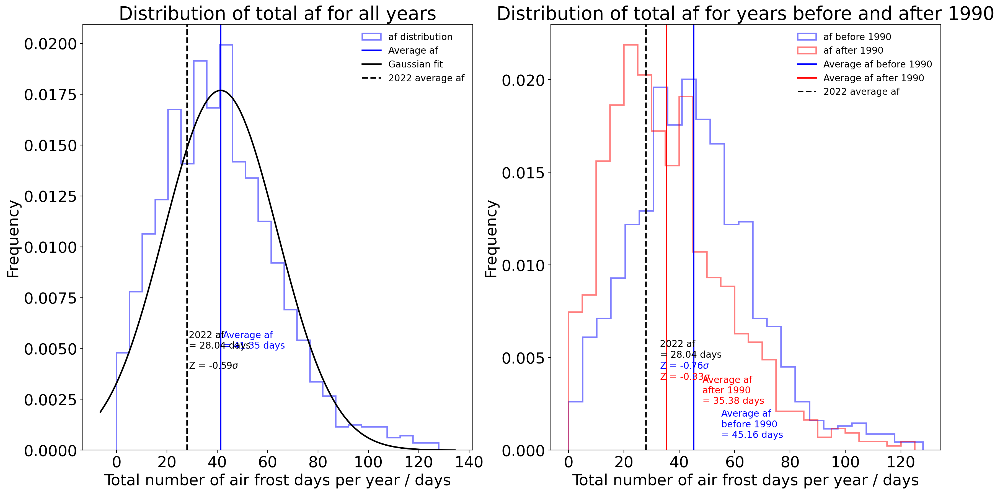

In [84]:
mask = combined_data['yyyy'] == 2022
df_2022 = combined_data[mask]
#Calculate the average af for 2022
# af_2022 = df_2022['af'].mean()
af_2022 = df_2022['af'].mean()
# af_2022 = combined_data.sort_values(by='af', ascending=True).head(1)['af'].values[0]
# af_2022 = df_2022['af']
#Fit a normal distribution to the data
mu, std = norm.fit(combined_data['af'])
#Calculate the significance of the average af for 2022 using Z_af = (af_2022 - mu_af)/std_af
Z_af = (af_2022 - mu) / std
#Distribution of af for all years
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.hist(combined_data['af'],
         bins=25,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label='af distribution',
         histtype='step')
ax1.axvline(mu, color='blue', linewidth=2, label='Average af')
#Indicate the value for mu on the plot
ax1.text(mu + 1,
         0.005,
         'Average af \n= {:.2f} days'.format(mu),
         fontsize=12,
         color='blue')
#Plot the normal distribution
xmin, xmax = ax1.get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
ax1.plot(x, p, 'k', linewidth=2, label='Gaussian fit', color='black')
ax1.axvline(af_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label='2022 average af')
#Indicate the value for 2022 on the plot
ax1.text(af_2022 + 0.6,
         0.005,
         '2022 af \n= {:.2f} days'.format(af_2022),
         fontsize=12,
         color='black')
ax1.text(af_2022 + 0.6,
         0.004,
         r'Z = {:.2f}$\sigma$'.format(Z_af),
         fontsize=12,
         color='black')
ax1.set_xlabel(r'Total number of air frost days per year / days')
ax1.set_ylabel('Frequency')
ax1.set_title(r'Distribution of total af for all years')
ax1.legend(frameon=False, fontsize=12, loc='upper right')

#Split the data into before and after 1990
mask = combined_data['yyyy'] < 1990
combined_data_before = combined_data[mask]
mask = combined_data['yyyy'] >= 1990
combined_data_after = combined_data[mask]

#Calculate the average af for before and after 1990
af_before = combined_data_before['af'].mean()
af_after = combined_data_after['af'].mean()

#Distribution of af for before and after 1990
ax2.hist(combined_data_before['af'],
         bins=25,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label='af before 1990',
         histtype='step')
ax2.hist(combined_data_after['af'],
         bins=25,
         color='red',
         linewidth=2,
         density=True,
         alpha=0.5,
         label='af after 1990',
         histtype='step')
ax2.axvline(af_before,
            color='blue',
            linewidth=2,
            label='Average af before 1990')
#Indicate the value for mu on the plot
ax2.text(af_before + 10,
         0.00067,
         'Average af \nbefore 1990 \n= {:.2f} days'.format(af_before),
         fontsize=12,
         color='blue')
ax2.axvline(af_after, color='red', linewidth=2, label='Average af after 1990')
#Indicate the value for mu on the plot
ax2.text(af_after + 13,
         0.0025,
         'Average af \nafter 1990 \n= {:.2f} days'.format(af_after),
         fontsize=12,
         color='red')
ax2.axvline(af_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label='2022 average af')
#Indicate the value for 2022 on the plot
ax2.text(af_2022 + 5,
         0.005,
         '2022 af \n= {:.2f} days'.format(af_2022),
         fontsize=12,
         color='black')
#Calculate the significance of the average af for 2022 using Z_af = (af_2022 - mu_af)/std_af with respect to the average af before 1990
Z_af_wrt_before = (af_2022 - af_before) / std
ax2.text(af_2022 + 5,
         0.0044,
         r'Z = {:.2f}$\sigma$'.format(Z_af_wrt_before),
         fontsize=12,
         color='blue')
#Calculate the significance of the average af for 2022 using Z_af = (af_2022 - mu_af)/std_af with respect to the average af after 1990
Z_af_wrt_after = (af_2022 - af_after) / std
ax2.text(af_2022 + 5,
         0.0038,
         r'Z = {:.2f}$\sigma$'.format(Z_af_wrt_after),
         fontsize=12,
         color='red')

ax2.set_xlabel(r'Total number of air frost days per year / days')
ax2.set_ylabel('Frequency')
ax2.set_title(r'Distribution of total af for years before and after 1990')
ax2.legend(frameon=False, fontsize=12, loc='upper right')
# plt.savefig('afdist.pdf', bbox_inches='tight', format='pdf')
plt.show()

/tmp/ipykernel_255/2262721916.py:32: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.1, 0.1, 0.1, 1)). The keyword argument will take precedence.
  ax1.plot(x, p, 'k', linewidth=2, label='Gaussian distribution', color='black')


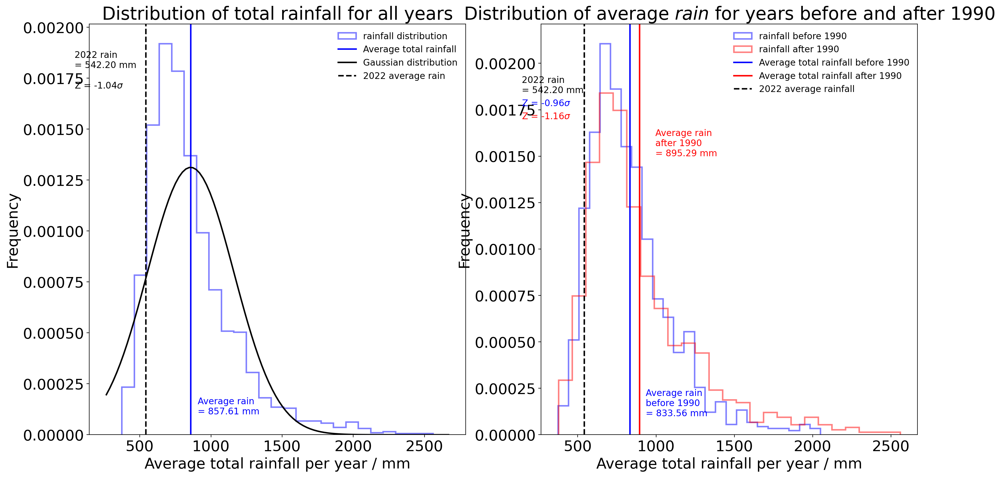

In [85]:
mask = combined_data['yyyy'] == 2022
df_2022 = combined_data[mask]
#Calculate the average rain for 2022
# rain_2022 = df_2022['rain'].mean()
rain_2022 = df_2022['rain'].values[0]
# rain_2022 = df_2022['rain']
#Fit a normal distribution to the data
mu, std = norm.fit(combined_data['rain'])
#Calculate the significance of the average rain for 2022 using Z_rain = (rain_2022 - mu_rain)/std_rain
Z_rain = (rain_2022 - mu) / std
#Distribution of rain for all years
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.hist(combined_data['rain'],
         bins=25,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label='rainfall distribution',
         histtype='step')
ax1.axvline(mu, color='blue', linewidth=2, label='Average total rainfall')
#Indicate the value for mu on the plot
ax1.text(mu + 50,
         0.0001,
         'Average rain \n= {:.2f} mm'.format(mu),
         fontsize=12,
         color='blue')
#Plot the normal distribution
xmin, xmax = ax1.get_xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
ax1.plot(x, p, 'k', linewidth=2, label='Gaussian distribution', color='black')
ax1.axvline(rain_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label='2022 average rain')
#Indicate the value for 2022 on the plot
ax1.text(rain_2022 - 500,
         0.0018,
         '2022 rain \n= {:.2f} mm'.format(rain_2022),
         fontsize=12,
         color='black')
ax1.text(rain_2022 - 500,
         0.0017,
         r'Z = {:.2f}$\sigma$'.format(Z_rain),
         fontsize=12,
         color='black')
ax1.set_xlabel(r'Average total rainfall per year / mm')
ax1.set_ylabel('Frequency')
ax1.set_title(r'Distribution of total rainfall for all years')
ax1.legend(frameon=False, fontsize=12, loc='upper right')

#Split the data into before and after 1990
mask = combined_data['yyyy'] < 1990
combined_data_before = combined_data[mask]
mask = combined_data['yyyy'] >= 1990
combined_data_after = combined_data[mask]

#Calculate the average rain for before and after 1990
rain_before = combined_data_before['rain'].mean()
rain_after = combined_data_after['rain'].mean()

#Distribution of rain for before and after 1990
ax2.hist(combined_data_before['rain'],
         bins=25,
         color='blue',
         linewidth=2,
         density=True,
         alpha=0.5,
         label='rainfall before 1990',
         histtype='step')
ax2.hist(combined_data_after['rain'],
         bins=25,
         color='red',
         linewidth=2,
         density=True,
         alpha=0.5,
         label='rainfall after 1990',
         histtype='step')
ax2.axvline(rain_before,
            color='blue',
            linewidth=2,
            label='Average total rainfall before 1990')
#Indicate the value for mu on the plot
ax2.text(rain_before + 100,
         0.0001,
         'Average rain \nbefore 1990 \n= {:.2f} mm'.format(rain_before),
         fontsize=12,
         color='blue')
ax2.axvline(rain_after,
            color='red',
            linewidth=2,
            label='Average total rainfall after 1990')
#Indicate the value for mu on the plot
ax2.text(rain_after + 100,
         0.0015,
         'Average rain \nafter 1990 \n= {:.2f} mm'.format(rain_after),
         fontsize=12,
         color='red')
ax2.axvline(rain_2022,
            color='black',
            linestyle='--',
            linewidth=2,
            label='2022 average rainfall')
#Indicate the value for 2022 on the plot
ax2.text(rain_2022 - 400,
         0.00184,
         '2022 rain \n= {:.2f} mm'.format(rain_2022),
         fontsize=12,
         color='black')
#Calculate the significance of the average rain for 2022 using Z_rain = (rain_2022 - mu_rain)/std_rain with respect to the average rain before 1990
Z_rain_wrt_before = (rain_2022 - rain_before) / std
ax2.text(rain_2022 - 400,
         0.00177,
         r'Z = {:.2f}$\sigma$'.format(Z_rain_wrt_before),
         fontsize=12,
         color='blue')
#Calculate the significance of the average rain for 2022 using Z_rain = (rain_2022 - mu_rain)/std_rain with respect to the average rain after 1990
Z_rain_wrt_after = (rain_2022 - rain_after) / std
ax2.text(rain_2022 - 400,
         0.0017,
         r'Z = {:.2f}$\sigma$'.format(Z_rain_wrt_after),
         fontsize=12,
         color='red')

ax2.set_xlabel(r'Average total rainfall per year / mm')
ax2.set_ylabel('Frequency')
ax2.set_title(
    r'Distribution of average $rain$ for years before and after 1990')
ax2.legend(frameon=False, fontsize=12, loc='upper right')
plt.savefig('raindist.pdf', bbox_inches='tight', format='pdf')
plt.show()

### Machine Learning study



#### Parameter search optimisation for BDT



In [86]:
import glob
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV


def preprocess_data(data, file):
    # Split the string values on whitespace and take the first value
    data = data.apply(lambda x: x.str.split().str[0]
                      if x.dtype == object else x)
    # Removing spaces
    data = data.apply(lambda x: x.str.strip() if x.dtype == object else x)
    data.replace(to_replace='---', value=np.nan, inplace=True, regex=True)

    # Remove rows with missing values
    data = data.dropna()

    return data


def nominal_case(data):

    all_years = []
    all_tmax = []
    all_tmin = []
    all_af = []
    all_rain = []
    all_sun = []

    # find all the years
    year = data['yyyy']

    # find all the unique years
    unique_year = year.unique()

    # for each unique year
    for year in unique_year:

        # find all the rows with that year
        mask = df['yyyy'] == year

        # get a new dataframe with only that year
        df_year = df[mask]

        if len(df_year) == 12:

            # create a list to append the summer tmax
            summer_tmax = []

            # find the next year
            int_year = int(year)
            next_year = int_year + 1
            next_year = str(next_year)
            mask2 = df['yyyy'] == next_year
            df_next_year = df[mask2]

            # for each month in the summer
            for month in range(6, 9):

                month2 = str(month)

                # find all the rows with that month
                month_mask = df_year['mm'] == month2

                # get a new dataframe with only that month
                temp = df_year[month_mask]

                if temp.empty:
                    continue
                else:
                    answer = temp['tmax'].values

                    # append the tmax to the list
                    summer_tmax.append(float(answer))

            # find the average of the summer tmax

            summer_tmax_avg = np.mean(summer_tmax)

            # create a list to append the winter tmin
            winter_tmin = []

            # for each month in the winter
            for month in range(1, 3):

                month2 = str(month)

                # find all the rows with that month
                month_mask = df_next_year['mm'] == month2

                # get a new dataframe with only that month
                temp = df_next_year[month_mask]

                if temp.empty:
                    continue
                else:
                    answer = temp['tmin'].values

                    #append the tmin to list
                    winter_tmin.append(float(answer))

            # add the month of december
            month_mask = df_year['mm'] == '12'
            temp = df_year[month_mask]
            answer = temp['tmin'].values
            winter_tmin.append(float(answer))

            # find the average of the winter tmin
            winter_tmin_avg = np.mean(winter_tmin)

            # find the number of days with air frost
            af = list(map(float, df_year['af'].values))
            af_sum = np.sum(af)

            rain = list(map(float, df_year['rain'].values))
            rain_sum = np.sum(rain)

            sun = list(map(float, df_year['sun'].values))
            sun_sum = np.sum(sun)

            all_years.append(year)
            all_tmax.append(summer_tmax_avg)
            all_tmin.append(winter_tmin_avg)
            all_af.append(af_sum)
            all_rain.append(rain_sum)
            all_sun.append(sun_sum)

    big_dataframe = pd.DataFrame(
        data={
            'yyyy': all_years,
            'tmax': all_tmax,
            'tmin': all_tmin,
            'af': all_af,
            'rain': all_rain,
            'sun': all_sun
        })

    return big_dataframe


# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames = []

# Iterate over the data files
for file in data_files:

    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    # Keep only the rows with actual data (skip the first row with units)
    df = df.iloc[2:]

    # Preprocess the data
    df = preprocess_data(df, file)

    # Calculate nominal case
    df = nominal_case(df)

    # Append the preprocessed data to the list
    data_frames.append(df)

# Concatenate the DataFrames into a single dataset
combined_data = pd.concat(data_frames)
combined_data
#Save the combined data to a CSV file in a different directory
# combined_data.to_csv('combined_data.csv', index=False)

# # Create a new column called 'target'
combined_data['target'] = 0

# # Convert the 'yyyy' column to an integer
combined_data['yyyy'] = combined_data['yyyy'].astype(int)
# combined_data['mm'] = combined_data['mm'].astype(int)

# # # Set the target value to 1 for data from after 1990
combined_data.loc[combined_data['yyyy'] >= 1990, 'target'] = 1
# print(combined_data)

#Drop the yyyy column
combined_data = combined_data.drop('yyyy', axis=1)

# Split the data into features and target
X = combined_data.drop('target', axis=1)
y = combined_data['target']

# X = preprocess_data(X, file)
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
import numpy as np

dt = DecisionTreeClassifier(max_depth=2,
                            min_samples_leaf=5,
                            max_features=int(np.sqrt(X_train.shape[1])),
                            splitter="best",
                            criterion="gini")

ada = AdaBoostClassifier(dt, n_estimators=100, random_state=1)

#Paramaters to search over
params = {
    'estimator__min_samples_leaf': [10, 20],
    'estimator__max_depth': [2, 3],
}

print("Training...")
rcv = GridSearchCV(ada, params, verbose=1, n_jobs=-1)
rcv.fit(X_train, y_train)

print("Best set of parameters: %s" % rcv.best_params_)

adabest = rcv.best_estimator_
adabest.fit(X_train, y_train)

print("Training set score: %f" % adabest.score(X_train, y_train))
print("Test set score:     %f" % adabest.score(X_test, y_test))

# Compute the confidence interval for the test set accuracy
from sklearn.utils import resample
from sklearn.metrics import accuracy_score

# Initialize an empty list to store the accuracies
accuracies = []

# Iterate over 1000 bootstrap samples
for i in range(1000):

    # Resample the test set
    X_test_resampled, y_test_resampled = resample(X_test, y_test)

    # Compute the accuracy of the model on the resampled test set
    accuracy = adabest.score(X_test_resampled, y_test_resampled)

    # Append the accuracy to the list
    accuracies.append(accuracy)

# Compute the 95% confidence interval
confidence_interval = np.percentile(accuracies, [2.5, 97.5])
print("Confidence interval: [%f, %f]" %
      (confidence_interval[0], confidence_interval[1]))

Training...
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best set of parameters: {'estimator__max_depth': 2, 'estimator__min_samples_leaf': 20}
Training set score: 0.815193
Test set score:     0.650794
Confidence interval: [0.607710, 0.698413]


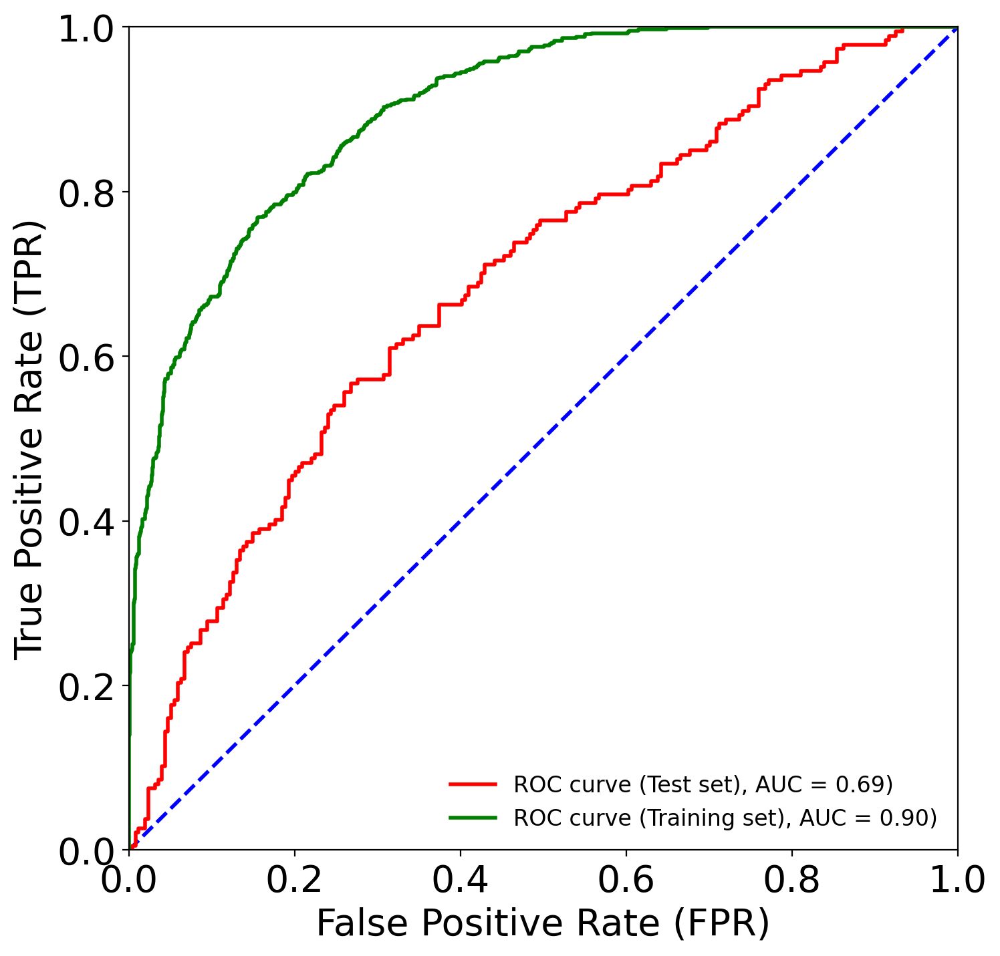

In [87]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = adabest.predict_proba(X_test)[:, 1]
p_train = adabest.predict_proba(X_train)[:, 1]


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)
    # plt.xlim([-0.05, 1.05])

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(frameon=False, fontsize=12, loc='lower right')
    #     plt.savefig("nominal_case_BDT_ROCcurve_nofeatureselection.pdf", bbox_inches='tight', format='pdf')
    plt.show()


plotROC(y_test, p_test, y_train, p_train)

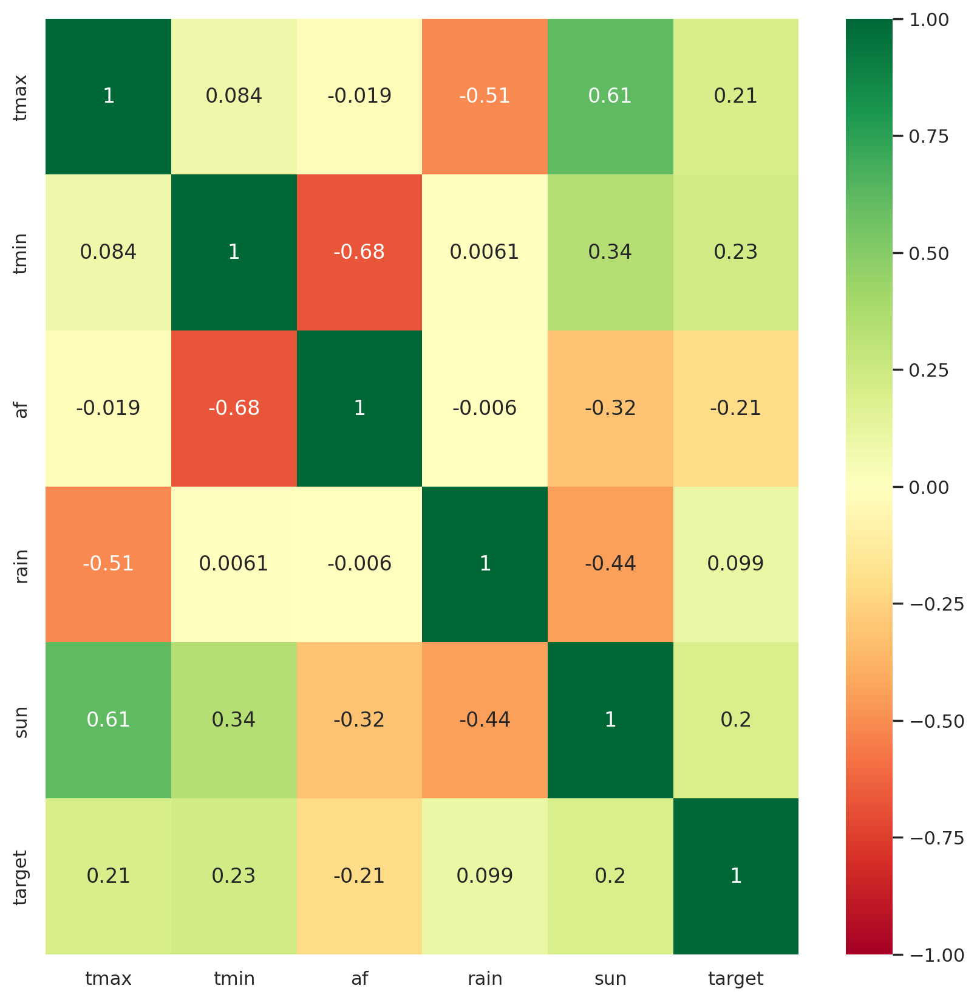

In [88]:
#Plot the correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()

plt.figure(figsize=(10, 10))
sns.heatmap(combined_data.corr(), annot=True, cmap="RdYlGn", vmin=-1, vmax=1)
# plt.savefig("nominalBDT_correlation_matrix.pdf", bbox_inches='tight', format='pdf')
plt.show()

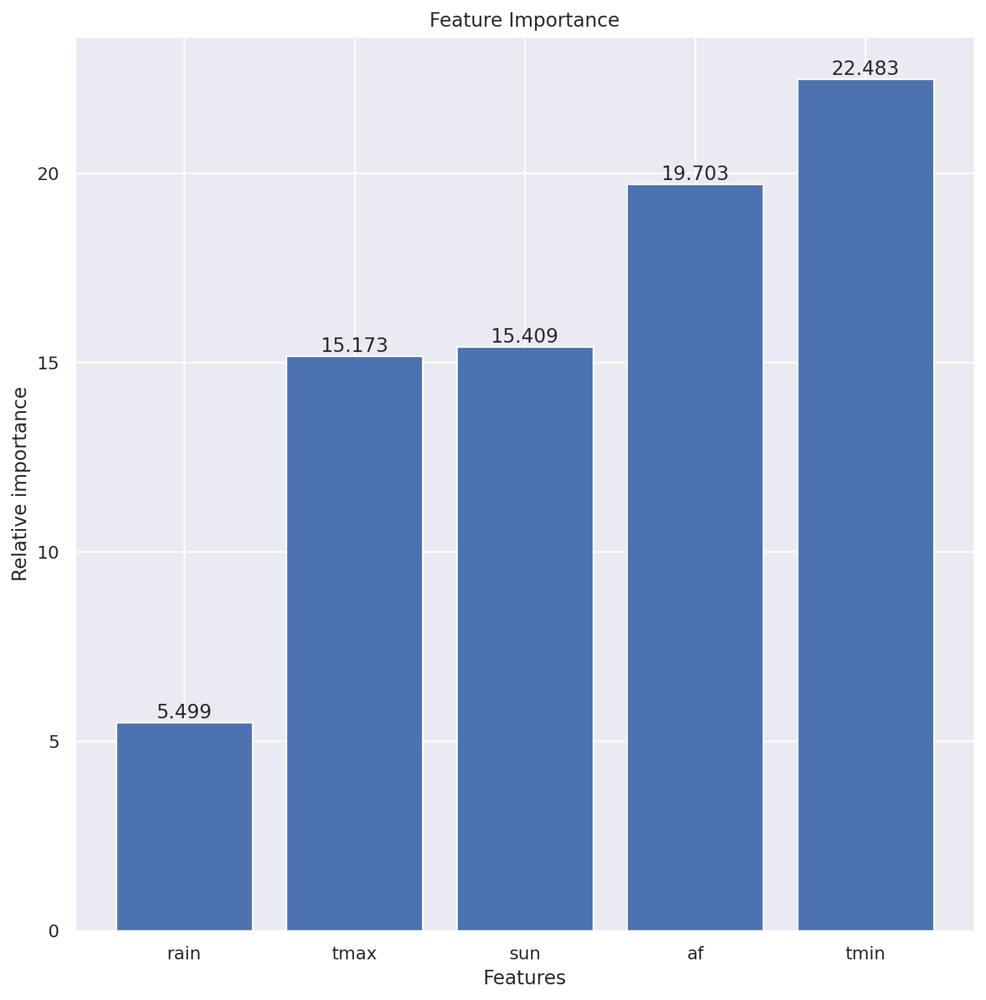

In [89]:
#Rank the features
selector = SelectKBest(f_classif, k=4)
selector.fit(X_train, y_train)

#Get the raw p-values for each feature, and transform from p-values into scores
scores = -np.log10(selector.pvalues_)
indices = np.argsort(scores)
plt.figure(figsize=(10, 10))
plt.title("Feature Importance")
plt.bar(range(len(X_train.columns)), scores[indices])
#Plot the numbers above the bars
for i in range(len(X_train.columns)):
    plt.text(i,
             scores[indices][i],
             round(scores[indices][i], 3),
             ha='center',
             va='bottom')
plt.xticks(range(len(X_train.columns)), X_train.columns[indices])
#y-label
plt.ylabel('Relative importance')
#x-label
plt.xlabel('Features')
# plt.savefig("nominal_case_BDT_ranking_features_reverse.pdf", bbox_inches='tight', format='pdf')
plt.show()

In [90]:
#After selecting the best features, we can train a new model using only the selected features
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

#Train a new model using only the selected features
dt = DecisionTreeClassifier(max_depth=2,
                            min_samples_leaf=5,
                            max_features=int(np.sqrt(X_train.shape[1])),
                            splitter="best",
                            criterion="gini")

ada = AdaBoostClassifier(dt, n_estimators=100, random_state=1)

#Paramaters to search over
params = {
    'estimator__min_samples_leaf': [10, 20],
    'estimator__max_depth': [2, 3],
}

print("Training...")
rcv = GridSearchCV(ada, params, verbose=1, n_jobs=-1)
rcv.fit(X_train_selected, y_train)

print("Best set of parameters: %s" % rcv.best_params_)
adabest = rcv.best_estimator_
adabest.fit(X_train_selected, y_train)

print("Training set score: %f" % adabest.score(X_train_selected, y_train))
print("Test set score:     %f" % adabest.score(X_test_selected, y_test))

# Compute the confidence interval for the test set accuracy
from sklearn.utils import resample
from sklearn.metrics import accuracy_score

# Initialize an empty list to store the accuracies
accuracies = []

# Iterate over 1000 bootstrap samples
for i in range(1000):

    # Resample the test set
    X_test_resampled, y_test_resampled = resample(X_test_selected, y_test)

    # Compute the accuracy of the model on the resampled test set
    accuracy = adabest.score(X_test_resampled, y_test_resampled)

    # Append the accuracy to the list
    accuracies.append(accuracy)

# Compute the 95% confidence interval
confidence_interval = np.percentile(accuracies, [2.5, 97.5])
print("Confidence interval: [%f, %f]" %
      (confidence_interval[0], confidence_interval[1]))

Training...
Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best set of parameters: {'estimator__max_depth': 2, 'estimator__min_samples_leaf': 10}
Training set score: 0.813492
Test set score:     0.619048
Confidence interval: [0.573696, 0.662132]


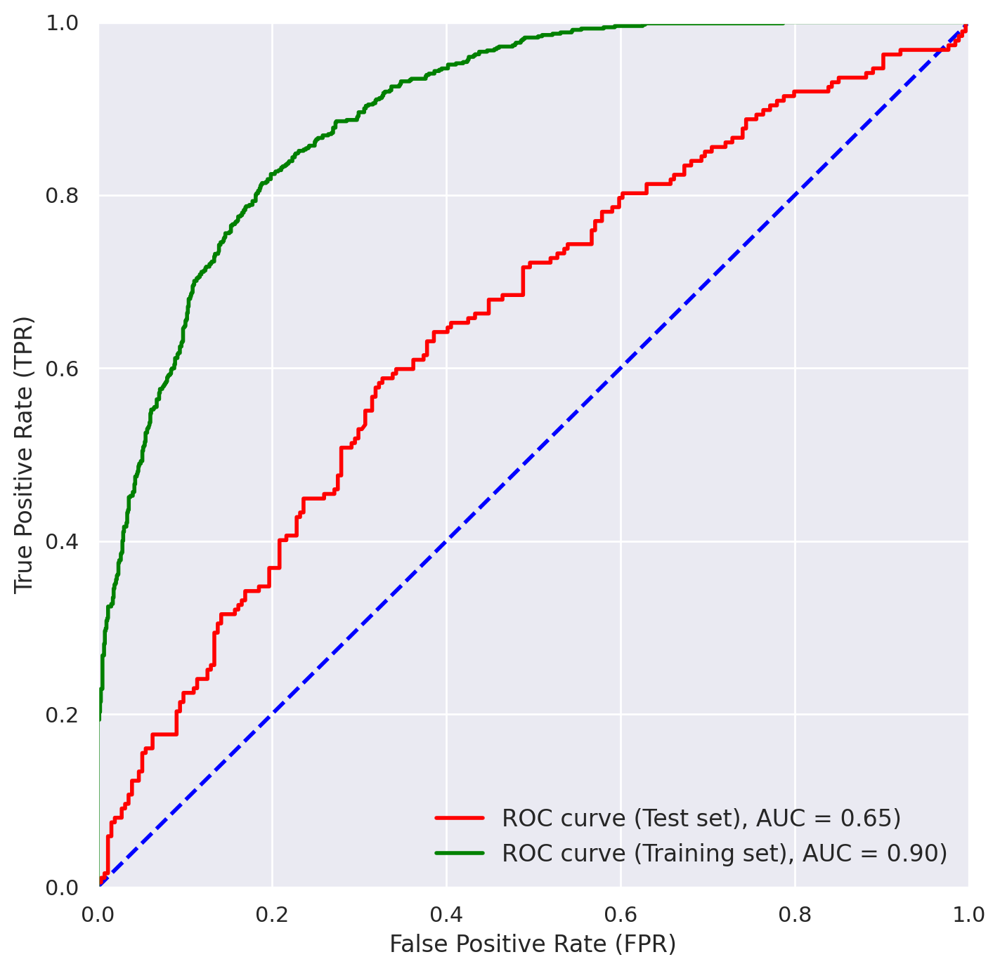

In [91]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = adabest.predict_proba(X_test_selected)[:, 1]
p_train = adabest.predict_proba(X_train_selected)[:, 1]


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)
    # plt.xlim([-0.05, 1.05])

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(frameon=False, fontsize=12, loc='lower right')
    #     plt.savefig("nominal_case_BDT_ROCcurve_withfeatureselection.pdf", bbox_inches='tight', format='pdf')
    plt.show()


plotROC(y_test, p_test, y_train, p_train)

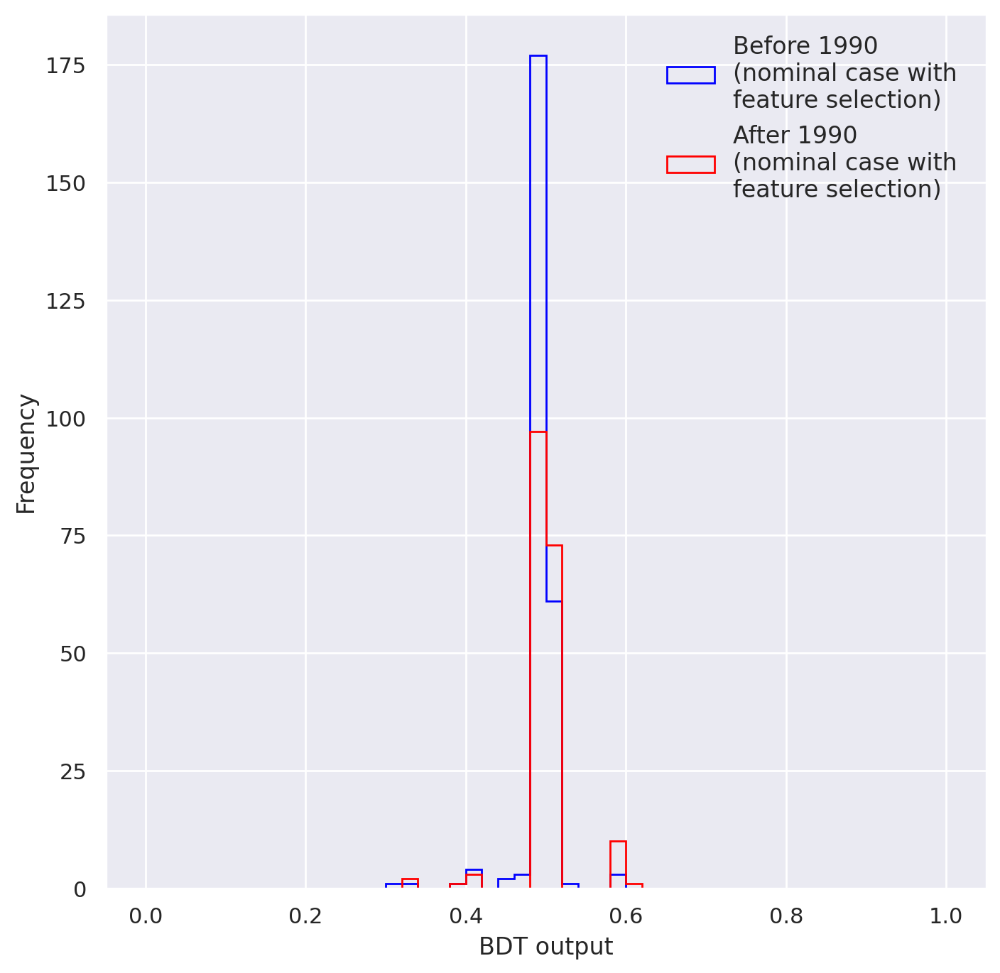

In [92]:
#Plot the BDT output for the test set for before and after 1990
plt.figure(figsize=(8, 8))
plt.hist(p_test[y_test == 0],
         bins=50,
         range=(0, 1),
         histtype='step',
         color='blue',
         label='Before 1990 \n(nominal case with \nfeature selection)')
plt.hist(p_test[y_test == 1],
         bins=50,
         range=(0, 1),
         histtype='step',
         color='red',
         label='After 1990 \n(nominal case with \nfeature selection)')
plt.xlabel('BDT output')
plt.ylabel('Frequency')
plt.legend(frameon=False, fontsize=12, loc='upper right')
# plt.savefig("nominal_case_BDT_output_withfeatureselection.pdf", bbox_inches='tight', format='pdf')
plt.show()

Now introduce new variables.  



In [93]:
import glob
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV


def preprocess_data(data, file):
    # Split the string values on whitespace and take the first value
    data = data.apply(lambda x: x.str.split().str[0]
                      if x.dtype == object else x)
    # Removing spaces
    data = data.apply(lambda x: x.str.strip() if x.dtype == object else x)
    data.replace(to_replace='---', value=np.nan, inplace=True, regex=True)

    # Remove rows with missing values
    data = data.dropna()

    # # Normalize the data to ensure that all features are on the same scale
    # data = (data - data.mean()) / data.std()

    return data


def many_variables(data):

    all_years = []
    all_tmax = []
    all_tmin = []
    all_af = []
    all_rain = []
    all_sun = []
    all_tmax_max = []
    all_tmin_min = []
    all_af_max = []
    all_af_min = []
    all_rain_max = []
    all_rain_min = []
    all_sun_max = []
    all_sun_min = []

    # find all the years
    year = data['yyyy']

    # find all the unique years
    unique_year = year.unique()

    # for each unique year
    for year in unique_year:

        # find all the rows with that year
        mask = df['yyyy'] == year

        # get a new dataframe with only that year
        df_year = df[mask]

        if len(df_year) == 12:

            #Find the maximum tmax for the year
            tmax = list(map(float, df_year['tmax'].values))
            tmax_max = np.max(tmax)
            all_tmax_max.append(tmax_max)

            #Find the minimum tmin for the year
            tmin = list(map(float, df_year['tmin'].values))
            tmin_min = np.min(tmin)
            all_tmin_min.append(tmin_min)

            #Find the maximum af for the year
            af = list(map(float, df_year['af'].values))
            af_max = np.max(af)
            all_af_max.append(af_max)

            #Find the minimum af for the year
            af_min = np.min(af)
            all_af_min.append(af_min)

            #Find the maximum rain for the year
            rain = list(map(float, df_year['rain'].values))
            rain_max = np.max(rain)
            all_rain_max.append(rain_max)

            #Find the minimum rain for the year
            rain_min = np.min(rain)
            all_rain_min.append(rain_min)

            #Find the maximum sun for the year
            sun = list(map(float, df_year['sun'].values))
            sun_max = np.max(sun)
            all_sun_max.append(sun_max)

            #Find the minimum sun for the year
            sun_min = np.min(sun)
            all_sun_min.append(sun_min)

            # create a list to append the summer tmax
            summer_tmax = []

            # find the next year
            int_year = int(year)
            next_year = int_year + 1
            next_year = str(next_year)
            mask2 = df['yyyy'] == next_year
            df_next_year = df[mask2]

            # for each month in the summer
            for month in range(6, 9):

                month2 = str(month)

                # find all the rows with that month
                month_mask = df_year['mm'] == month2

                # get a new dataframe with only that month
                temp = df_year[month_mask]

                if temp.empty:
                    continue
                else:
                    answer = temp['tmax'].values

                    # append the tmax to the list
                    summer_tmax.append(float(answer))

            # find the average of the summer tmax

            summer_tmax_avg = np.mean(summer_tmax)

            # create a list to append the winter tmin
            winter_tmin = []

            # for each month in the winter
            for month in range(1, 3):

                month2 = str(month)

                # find all the rows with that month
                month_mask = df_next_year['mm'] == month2

                # get a new dataframe with only that month
                temp = df_next_year[month_mask]

                if temp.empty:
                    continue
                else:
                    answer = temp['tmin'].values

                    #append the tmin to list
                    winter_tmin.append(float(answer))

            # add the month of december
            month_mask = df_year['mm'] == '12'
            temp = df_year[month_mask]
            answer = temp['tmin'].values
            winter_tmin.append(float(answer))

            # find the average of the winter tmin
            winter_tmin_avg = np.mean(winter_tmin)

            # find the number of days with air frost
            af = list(map(float, df_year['af'].values))
            af_sum = np.sum(af)

            rain = list(map(float, df_year['rain'].values))
            rain_sum = np.sum(rain)

            sun = list(map(float, df_year['sun'].values))
            sun_sum = np.sum(sun)

            all_years.append(year)
            all_tmax.append(summer_tmax_avg)
            all_tmin.append(winter_tmin_avg)
            all_af.append(af_sum)
            all_rain.append(rain_sum)
            all_sun.append(sun_sum)

    big_dataframe = pd.DataFrame(
        data={
            'yyyy': all_years,
            'tmax': all_tmax,
            'tmin': all_tmin,
            'af': all_af,
            'rain': all_rain,
            'sun': all_sun,
            'tmax_max': all_tmax_max,
            'tmin_min': all_tmin_min,
            'af_max': all_af_max,
            'af_min': all_af_min,
            'rain_max': all_rain_max,
            'rain_min': all_rain_min,
            'sun_max': all_sun_max,
            'sun_min': all_sun_min
        })
    return big_dataframe


# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')

# Initialize an empty list to store the DataFrames
data_frames = []

# Iterate over the data files
for file in data_files:

    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    # Keep only the rows with actual data (skip the first row with units)
    df = df.iloc[2:]

    # Preprocess the data
    df = preprocess_data(df, file)

    # Calculate nominal case
    df = many_variables(df)

    # Append the preprocessed data to the list
    data_frames.append(df)

# Concatenate the DataFrames into a single dataset
combined_data = pd.concat(data_frames)
combined_data

# Create a new column called 'target'
combined_data['target'] = 0

# Convert the 'yyyy' column to an integer
combined_data['yyyy'] = combined_data['yyyy'].astype(int)

# Set the target value to 1 for data from after 1990
combined_data.loc[combined_data['yyyy'] >= 1990, 'target'] = 1


#Drop the yyyy column
combined_data = combined_data.drop('yyyy', axis=1)

# Split the data into features and target
X = combined_data.drop('target', axis=1)
y = combined_data['target']

# X = preprocess_data(X, file)
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

dt = DecisionTreeClassifier(max_depth=5,
                            min_samples_leaf=25,
                            max_features=10,
                            splitter="best",
                            criterion="gini")

ada = AdaBoostClassifier(dt, n_estimators=100, random_state=1)

params = {
    'estimator__min_samples_leaf': [10, 25, 50],
    'estimator__max_depth': [2, 3, 4],
    'estimator__max_features': [3, 5, 7, 10],
    'n_estimators': [25, 30, 50, 100]
}

print("Training...")
rcv = GridSearchCV(ada, params, verbose=1, n_jobs=-1)
rcv.fit(X_train, y_train)

print("Best set of parameters: %s" % rcv.best_params_)
adabest = rcv.best_estimator_
adabest.fit(X_train, y_train)

print("Training set score: %f" % adabest.score(X_train, y_train))
print("Test set score:     %f" % adabest.score(X_test, y_test))

# Compute the confidence interval for the test set accuracy
from sklearn.utils import resample
from sklearn.metrics import accuracy_score

# Initialize an empty list to store the accuracies
accuracies = []

# Iterate over 1000 bootstrap samples
for i in range(1000):

    # Resample the test set
    X_test_resampled, y_test_resampled = resample(X_test, y_test)

    # Compute the accuracy of the model on the resampled test set
    accuracy = adabest.score(X_test_resampled, y_test_resampled)

    # Append the accuracy to the list
    accuracies.append(accuracy)

# Compute the 95% confidence interval
confidence_interval = np.percentile(accuracies, [2.5, 97.5])
print("Confidence interval: [%f, %f]" %
      (confidence_interval[0], confidence_interval[1]))

Training...
Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best set of parameters: {'estimator__max_depth': 3, 'estimator__max_features': 5, 'estimator__min_samples_leaf': 25, 'n_estimators': 100}
Training set score: 0.992063
Test set score:     0.721088
Confidence interval: [0.680215, 0.759637]


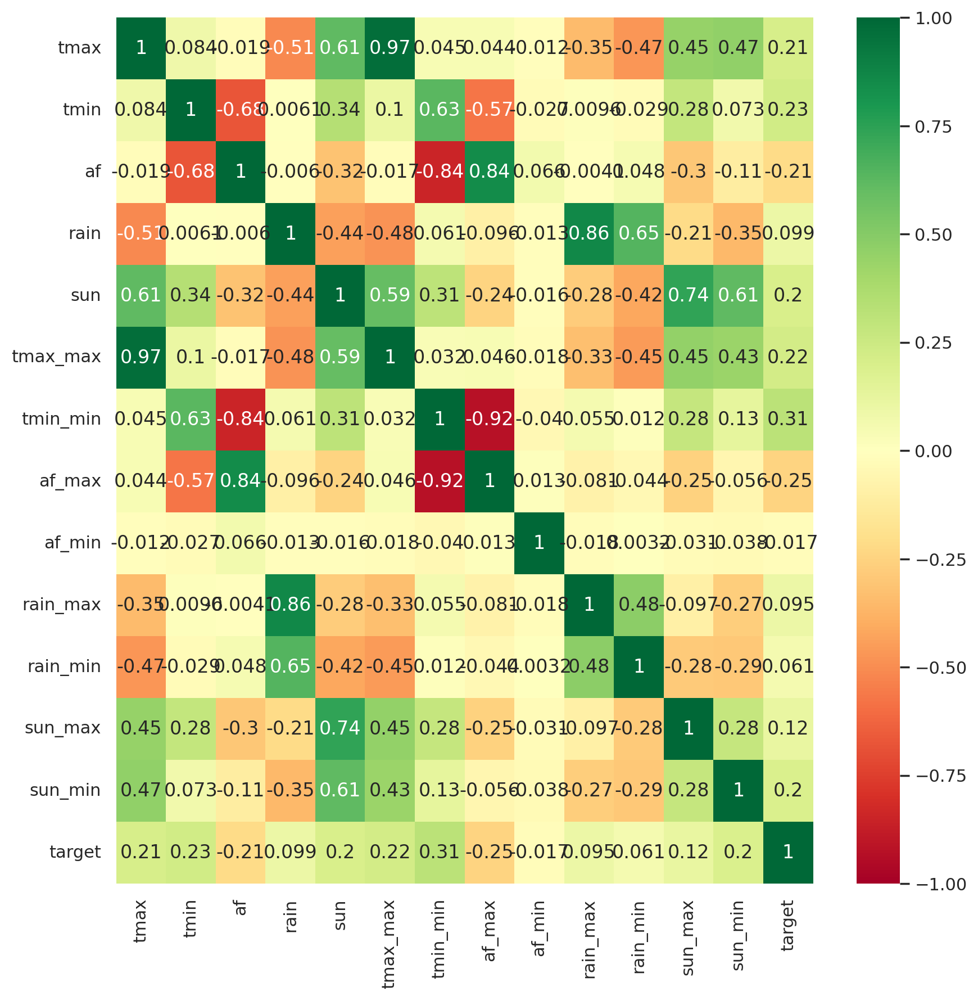

In [94]:
#Plot the correlation matrix
import seaborn as sns

sns.set()

plt.figure(figsize=(10, 10))
sns.heatmap(combined_data.corr(), annot=True, cmap="RdYlGn", vmin=-1, vmax=1)
# plt.savefig("addedfeatures_correlation_matrix.pdf", bbox_inches='tight', format='pdf')
plt.show()

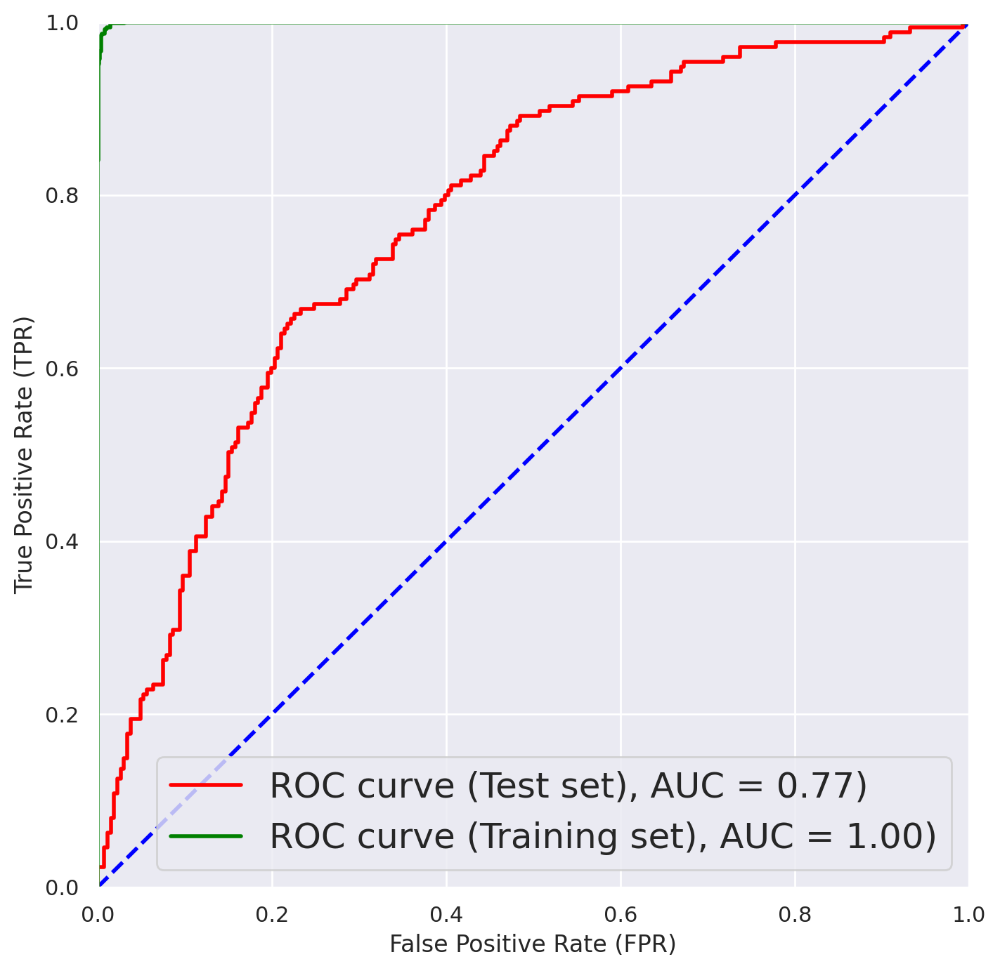

In [95]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = adabest.predict_proba(X_test)[:, 1]
p_train = adabest.predict_proba(X_train)[:, 1]


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)
    # plt.xlim([-0.05, 1.05])

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc="lower right", fontsize=18)
    #     plt.savefig("addedfeatures_case_BDT_ROCcurve_nofeatureselection.pdf", bbox_inches='tight', format='pdf')
    plt.show()


plotROC(y_test, p_test, y_train, p_train)

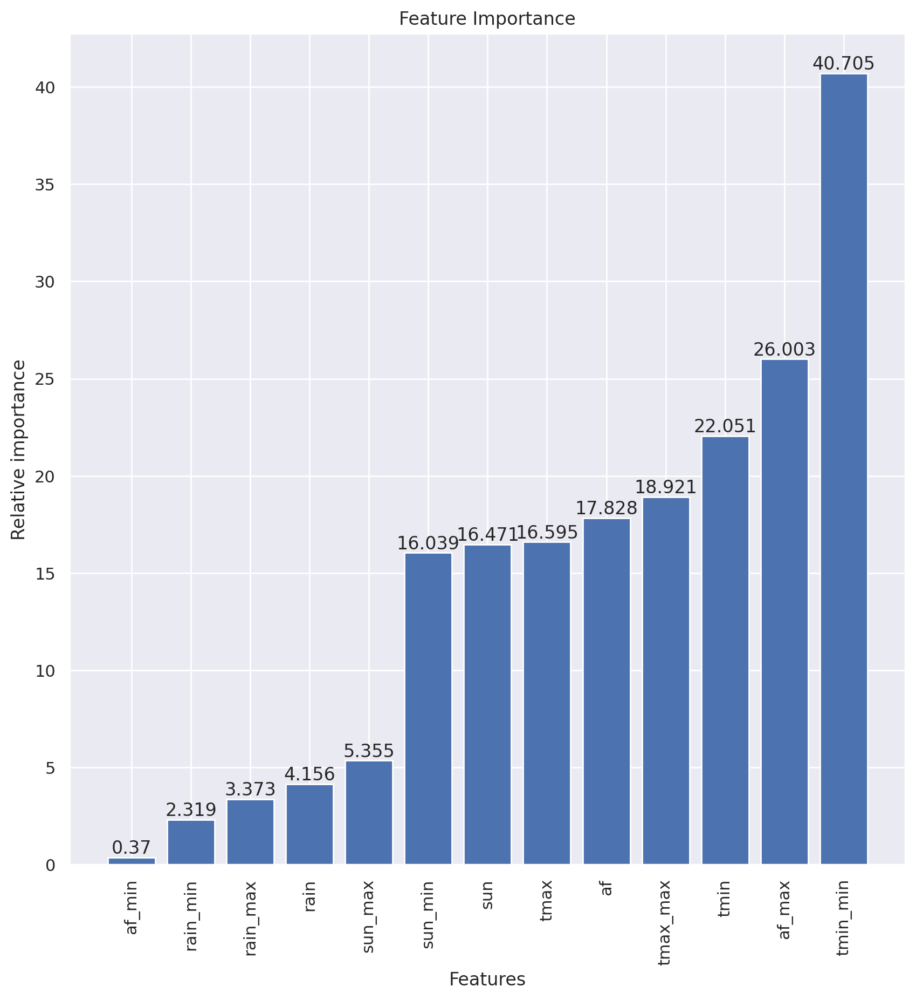

In [96]:
#Rank the features
selector = SelectKBest(f_classif, k=9)
selector.fit(X_train, y_train)

#Define scores
scores = -np.log10(selector.pvalues_)
#Now order the other way round
indices = np.argsort(scores)
plt.figure(figsize=(10, 10))
plt.title("Feature Importance")
plt.bar(range(len(X_train.columns)), scores[indices])
#Plot the numbers above the bars
for i in range(len(X_train.columns)):
    plt.text(i,
             scores[indices][i],
             round(scores[indices][i], 3),
             ha='center',
             va='bottom')
plt.xticks(range(len(X_train.columns)), X_train.columns[indices], rotation=90)
#y-label
plt.ylabel('Relative importance')
#x-label
plt.xlabel('Features')
# plt.savefig("addedfeatures_case_BDT_feature_importance.pdf", bbox_inches='tight', format='pdf')
plt.show()

In [97]:
#After selecting the best features, we can train a new model using only the selected features
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

dt = DecisionTreeClassifier(max_depth=4,
                            min_samples_leaf=25,
                            max_features=10,
                            splitter="best",
                            criterion="gini")

ada = AdaBoostClassifier(dt, n_estimators=100, random_state=1)

params = {
    'estimator__min_samples_leaf': [10, 25, 50],
    'estimator__max_depth': [2, 3],
    'estimator__max_features': [3, 5, 7, 10],
    'n_estimators': [25, 30, 50, 100]
}

print("Training...")
rcv = GridSearchCV(ada, params, verbose=1, n_jobs=-1)
rcv.fit(X_train_selected, y_train)

print("Best set of parameters: %s" % rcv.best_params_)
adabest = rcv.best_estimator_
adabest.fit(X_train_selected, y_train)

print("Training set score: %f" % adabest.score(X_train_selected, y_train))
print("Test set score:     %f" % adabest.score(X_test_selected, y_test))

# Compute the confidence interval for the test set accuracy
from sklearn.utils import resample
from sklearn.metrics import accuracy_score

# Initialize an empty list to store the accuracies
accuracies = []

# Iterate over 1000 bootstrap samples
for i in range(1000):

    # Resample the test set
    X_test_resampled, y_test_resampled = resample(X_test_selected, y_test)

    # Compute the accuracy of the model on the resampled test set
    accuracy = adabest.score(X_test_resampled, y_test_resampled)

    # Append the accuracy to the list
    accuracies.append(accuracy)

# Compute the 95% confidence interval
confidence_interval = np.percentile(accuracies, [2.5, 97.5])
print("Confidence interval: [%f, %f]" %
      (confidence_interval[0], confidence_interval[1]))

Training...
Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best set of parameters: {'estimator__max_depth': 2, 'estimator__max_features': 3, 'estimator__min_samples_leaf': 25, 'n_estimators': 100}
Training set score: 0.847506
Test set score:     0.689342
Confidence interval: [0.643991, 0.734694]


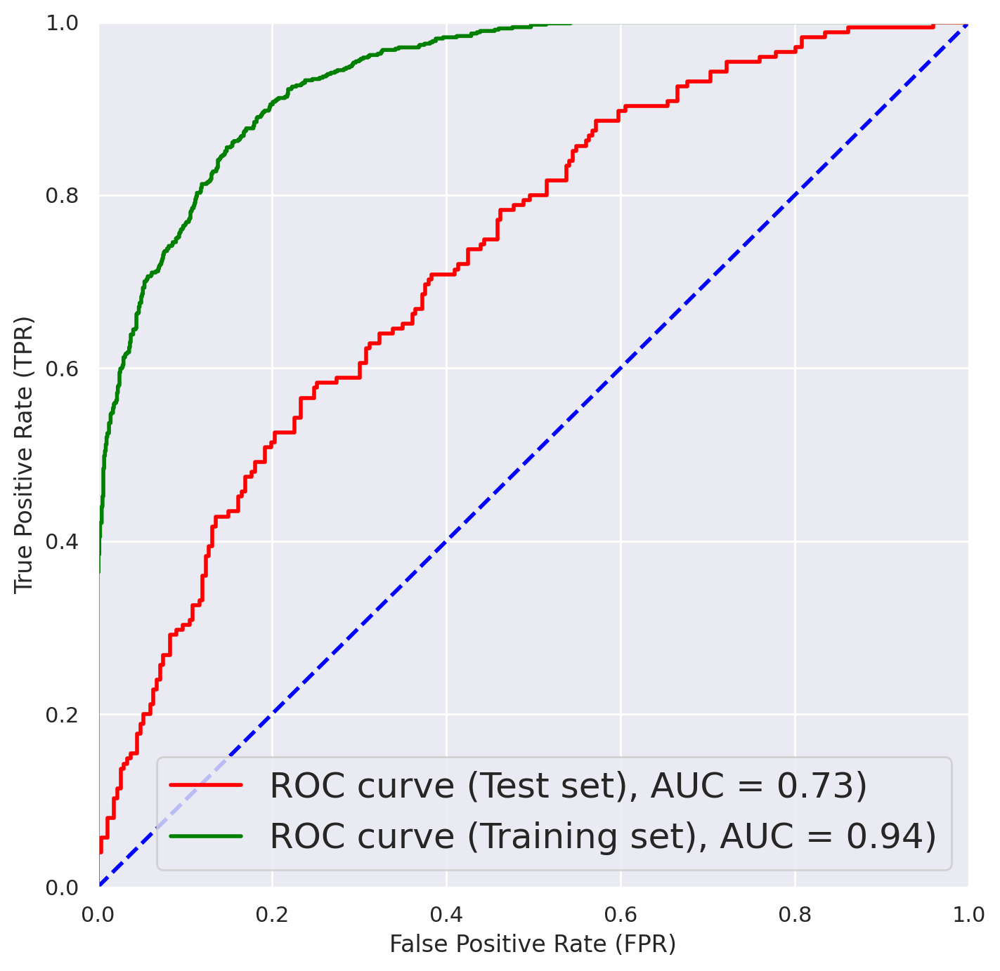

In [98]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = adabest.predict_proba(X_test_selected)[:, 1]
p_train = adabest.predict_proba(X_train_selected)[:, 1]


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc="lower right", fontsize=18)
    #     plt.savefig("addedfeatures_BDT_ROC_curve_withfeatureselection.pdf", bbox_inches='tight', format='pdf')
    plt.show()


plotROC(y_test, p_test, y_train, p_train)

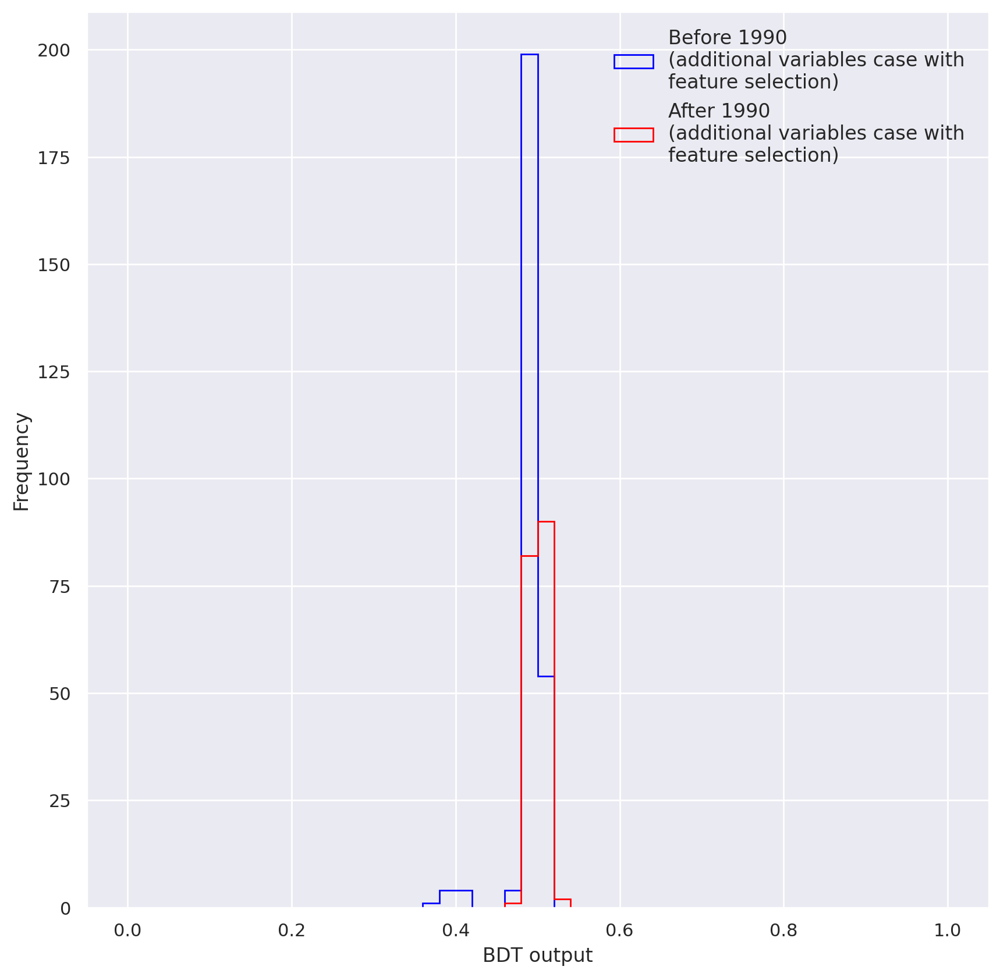

In [99]:
#Plot the BDT output for the test set for before and after 1990
plt.figure(figsize=(10, 10))
plt.hist(
    p_test[y_test == 0],
    bins=50,
    range=(0, 1),
    histtype='step',
    color='blue',
    label='Before 1990 \n(additional variables case with \nfeature selection)')
plt.hist(
    p_test[y_test == 1],
    bins=50,
    range=(0, 1),
    histtype='step',
    color='red',
    label='After 1990 \n(additional variables case with \nfeature selection)')
plt.xlabel('BDT output')
plt.ylabel('Frequency')
plt.legend(frameon=False, fontsize=12, loc='upper right')
# plt.savefig("addedfeatures_BDT_output_withfeatureselection.pdf", bbox_inches='tight', format='pdf')
plt.show()

Now use the big 60 variable dataset.  



In [100]:
#Import necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV


def preprocess_data(data, file):
    # Split the string values on whitespace and take the first value
    data = data.apply(lambda x: x.str.split().str[0]
                      if x.dtype == object else x)
    # Removing spaces
    data = data.apply(lambda x: x.str.strip() if x.dtype == object else x)
    data.replace(to_replace='---', value=np.nan, inplace=True, regex=True)

    return data

test_data = pd.read_csv(
    'Ballypatrick_data_CLEANED.csv',
    na_values='---',
    skiprows=0,
    names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

# # Keep only the rows with actual data (skip the first row with units)
df = test_data.iloc[2:]

# Preprocess the data
df = preprocess_data(df, file)

df

#Loop thorugh the data and append each month of data to a list
#Assign the list to a new row in a new dataframe for that year
all_years = []
all_tmax = []
all_tmin = []
all_af = []
all_rain = []
all_sun = []

#find all the years
year = df['yyyy']

# find all the unique years
unique_year = year.unique()

#loop through the unique years
for i in unique_year:
    #find all the rows that have the year i
    year_df = df[df['yyyy'] == i]
    #find all the months in the year i
    month = year_df['mm']
    #find all the unique months in the year i
    unique_month = month.unique()
    #loop through the unique months
    for j in unique_month:
        #find all the rows that have the month j
        month_df = year_df[year_df['mm'] == j]
        #find the tmax, tmin, af, rain, sun values for the month j
        tmax = month_df['tmax']
        tmin = month_df['tmin']
        af = month_df['af']
        rain = month_df['rain']
        sun = month_df['sun']
        #append the tmax, tmin, af, rain, sun values to a list
        all_tmax.append(tmax)
        all_tmin.append(tmin)
        all_af.append(af)
        all_rain.append(rain)
        all_sun.append(sun)
    #append the list to a new row in a new dataframe for that year
    all_years.append([all_tmax, all_tmin, all_af, all_rain, all_sun])
    #clear the list
    all_tmax = []
    all_tmin = []
    all_af = []
    all_rain = []
    all_sun = []

#convert the list to a dataframe
all_years_df = pd.DataFrame(all_years)
# Print the number of columns and rows in the dataframe
all_years_df

#rename the columns
all_years_df.columns = ['tmax', 'tmin', 'af', 'rain', 'sun']

# #Split each column into 12 columns, labbeled tmax1, tmax2, ..., tmax12, without inlcluding the row label
all_years_df = pd.concat([all_years_df, all_years_df['tmax'].apply(pd.Series)],
                         axis=1)
all_years_df = pd.concat([all_years_df, all_years_df['tmin'].apply(pd.Series)],
                         axis=1)
all_years_df = pd.concat([all_years_df, all_years_df['af'].apply(pd.Series)],
                         axis=1)
all_years_df = pd.concat([all_years_df, all_years_df['rain'].apply(pd.Series)],
                         axis=1)
all_years_df = pd.concat([all_years_df, all_years_df['sun'].apply(pd.Series)],
                         axis=1)

# drop the old columns
all_years_df = all_years_df.drop(['tmax', 'tmin', 'af', 'rain', 'sun'], axis=1)

#rename the new columns
all_years_df.columns = [
    'tmax1', 'tmax2', 'tmax3', 'tmax4', 'tmax5', 'tmax6', 'tmax7', 'tmax8',
    'tmax9', 'tmax10', 'tmax11', 'tmax12', 'tmin1', 'tmin2', 'tmin3', 'tmin4',
    'tmin5', 'tmin6', 'tmin7', 'tmin8', 'tmin9', 'tmin10', 'tmin11', 'tmin12',
    'af1', 'af2', 'af3', 'af4', 'af5', 'af6', 'af7', 'af8', 'af9', 'af10',
    'af11', 'af12', 'rain1', 'rain2', 'rain3', 'rain4', 'rain5', 'rain6',
    'rain7', 'rain8', 'rain9', 'rain10', 'rain11', 'rain12', 'sun1', 'sun2',
    'sun3', 'sun4', 'sun5', 'sun6', 'sun7', 'sun8', 'sun9', 'sun10', 'sun11',
    'sun12'
]

#Each column has two numbers separated by a space. remove the first number and keep the second number
#Use a loop to do this for each column
#First convert all values in the dataframe to strings
all_years_df = all_years_df.astype(str)
for i in range(1, 13):
    all_years_df['tmax' + str(i)] = all_years_df['tmax' +
                                                 str(i)].str.split().str[1]
    all_years_df['tmin' + str(i)] = all_years_df['tmin' +
                                                 str(i)].str.split().str[1]
    all_years_df['af' + str(i)] = all_years_df['af' +
                                               str(i)].str.split().str[1]
    all_years_df['rain' + str(i)] = all_years_df['rain' +
                                                 str(i)].str.split().str[1]
    all_years_df['sun' + str(i)] = all_years_df['sun' +
                                                str(i)].str.split().str[1]

#Convert all values in the dataframe to floats
all_years_df = all_years_df.astype(float)

#Add back in the year label to the dataframe for each row at the beginning of the dataframe
all_years_df.insert(0, 'year', unique_year)

In [101]:
# Use glob to list all of the .csv files in the current directory
data_files = glob.glob('*.csv')


def big_sixty(df):
    #Loop thorugh the data and append each month of data to a list
    #Assign the list to a new row in a new dataframe for that year
    all_years = []
    all_tmax = []
    all_tmin = []
    all_af = []
    all_rain = []
    all_sun = []

    #find all the years
    year = df['yyyy']

    # find all the unique years
    unique_year = year.unique()

    #loop through the unique years
    for i in unique_year:
        #find all the rows that have the year i
        year_df = df[df['yyyy'] == i]
        #find all the months in the year i
        month = year_df['mm']
        #find all the unique months in the year i
        unique_month = month.unique()
        #loop through the unique months
        for j in unique_month:
            #find all the rows that have the month j
            month_df = year_df[year_df['mm'] == j]
            #find the tmax, tmin, af, rain, sun values for the month j
            tmax = month_df['tmax']
            tmin = month_df['tmin']
            af = month_df['af']
            rain = month_df['rain']
            sun = month_df['sun']
            #append the tmax, tmin, af, rain, sun values to a list
            all_tmax.append(tmax)
            all_tmin.append(tmin)
            all_af.append(af)
            all_rain.append(rain)
            all_sun.append(sun)
        #append the list to a new row in a new dataframe for that year
        all_years.append([all_tmax, all_tmin, all_af, all_rain, all_sun])
        #clear the list
        all_tmax = []
        all_tmin = []
        all_af = []
        all_rain = []
        all_sun = []

    #convert the list to a dataframe
    all_years_df = pd.DataFrame(all_years)
    #rename the columns
    all_years_df.columns = ['tmax', 'tmin', 'af', 'rain', 'sun']

    # #Split each column into 12 columns, labbeled tmax1, tmax2, ..., tmax12, without inlcluding the row label
    all_years_df = pd.concat(
        [all_years_df, all_years_df['tmax'].apply(pd.Series)], axis=1)
    all_years_df = pd.concat(
        [all_years_df, all_years_df['tmin'].apply(pd.Series)], axis=1)
    all_years_df = pd.concat(
        [all_years_df, all_years_df['af'].apply(pd.Series)], axis=1)
    all_years_df = pd.concat(
        [all_years_df, all_years_df['rain'].apply(pd.Series)], axis=1)
    all_years_df = pd.concat(
        [all_years_df, all_years_df['sun'].apply(pd.Series)], axis=1)

    # drop the old columns
    all_years_df = all_years_df.drop(['tmax', 'tmin', 'af', 'rain', 'sun'],
                                     axis=1)

    #rename the new columns
    all_years_df.columns = [
        'tmax1', 'tmax2', 'tmax3', 'tmax4', 'tmax5', 'tmax6', 'tmax7', 'tmax8',
        'tmax9', 'tmax10', 'tmax11', 'tmax12', 'tmin1', 'tmin2', 'tmin3',
        'tmin4', 'tmin5', 'tmin6', 'tmin7', 'tmin8', 'tmin9', 'tmin10',
        'tmin11', 'tmin12', 'af1', 'af2', 'af3', 'af4', 'af5', 'af6', 'af7',
        'af8', 'af9', 'af10', 'af11', 'af12', 'rain1', 'rain2', 'rain3',
        'rain4', 'rain5', 'rain6', 'rain7', 'rain8', 'rain9', 'rain10',
        'rain11', 'rain12', 'sun1', 'sun2', 'sun3', 'sun4', 'sun5', 'sun6',
        'sun7', 'sun8', 'sun9', 'sun10', 'sun11', 'sun12'
    ]

    #Each column has two numbers separated by a space. remove the first number and keep the second number
    #Use a loop to do this for each column
    #First convert all values in the dataframe to strings
    all_years_df = all_years_df.astype(str)
    for i in range(1, 13):
        all_years_df['tmax' + str(i)] = all_years_df['tmax' +
                                                     str(i)].str.split().str[1]
        all_years_df['tmin' + str(i)] = all_years_df['tmin' +
                                                     str(i)].str.split().str[1]
        all_years_df['af' + str(i)] = all_years_df['af' +
                                                   str(i)].str.split().str[1]
        all_years_df['rain' + str(i)] = all_years_df['rain' +
                                                     str(i)].str.split().str[1]
        all_years_df['sun' + str(i)] = all_years_df['sun' +
                                                    str(i)].str.split().str[1]

    #Convert all values in the dataframe to floats
    all_years_df = all_years_df.astype(float)

    #Add back in the year label to the dataframe for each row at the beginning of the dataframe
    all_years_df.insert(0, 'year', unique_year)

    return all_years_df


def preprocess_data(data, file):
    data.replace(to_replace='---', value=np.nan, inplace=True, regex=True)

    # Remove rows with missing values
    data = data.dropna()

    return data


#Initialize the list of dataframes
data_frames = []
# Do this for all of the data files using a loop and form a new dataframe with all of the data
# Iterate over the data files
for file in data_files:

    # Load the data from the current file into a DataFrame
    df = pd.read_csv(file,
                     na_values='---',
                     skiprows=0,
                     names=['yyyy', 'mm', 'tmax', 'tmin', 'af', 'rain', 'sun'])

    # Keep only the rows with actual data (skip the first row with units)
    df = df.iloc[2:]

    # Preprocess the data
    df = preprocess_data(df, file)

    #Print the name of the file that is causing the error
    print(f'Importing... {file}')

    #Check if the dataframe is empty, if it is then skip to the next file
    if df.empty:
        continue

    # Calculate nominal case
    df = big_sixty(df)

    #Drop all rows with missing values
    df = df.dropna()

    #Try another method of dropping rows with NaN
    df = df.dropna(axis=0, how='any')

    # Append the preprocessed data to the list
    data_frames.append(df)

Importing... Ballypatrick_data_CLEANED.csv
Importing... Newtonrigg_data_CLEANED.csv
Importing... Nairn_data_CLEANED.csv
Importing... Suttonbonington_data_CLEANED.csv
Importing... Ringway_data_CLEANED.csv
Importing... Southampton_data_CLEANED.csv
Importing... Durham_data_CLEANED.csv
Importing... Paisley_data_CLEANED.csv
Importing... Lerwick_data_CLEANED.csv
Importing... Sheffield_data_CLEANED.csv
Importing... Shawbury_data_CLEANED.csv
Importing... Yeovilton_data_CLEANED.csv
Importing... Aberporth_data_CLEANED.csv
Importing... Lowestoft_data_CLEANED.csv
Importing... Stornoway_data_CLEANED.csv
Importing... Camborne_data_CLEANED.csv
Importing... Heathrow_data_CLEANED.csv
Importing... Tiree_data_CLEANED.csv
Importing... Waddington_data_CLEANED.csv
Importing... Whitby_data_CLEANED.csv
Importing... Manston_data_CLEANED.csv
Importing... Cardiff_data_CLEANED.csv
Importing... Oxford_data_CLEANED.csv
Importing... Wickairport_data_CLEANED.csv
Importing... Cwmystwyth_data_CLEANED.csv
Importing... C

In [102]:
# Concatenate all of the dataframes into a single dataframe
all_years_df_with_year = pd.concat(data_frames, ignore_index=True)

# Create a new column called 'target'
all_years_df_with_year['target'] = 0

#Convert any strings to floats
all_years_df_with_year = all_years_df_with_year.astype(float)

# # Set the target value to 1 for data from after 1990
all_years_df_with_year.loc[all_years_df_with_year['year'] >= 1990,
                           'target'] = 1

# #Drop the yyyy column
all_years_df = all_years_df_with_year.drop('year', axis=1)

#Drop the target column and then scale the data, then add the target column back in
all_years_df = all_years_df.drop('target', axis=1)
all_years_df = (all_years_df - all_years_df.mean()) / all_years_df.std()
all_years_df['target'] = all_years_df_with_year['target']

In [103]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import GridSearchCV

#Resample the minority class, which is after 1990
from sklearn.utils import resample

# Separate majority and minority classes
df_majority = all_years_df[all_years_df.target == 0]
df_minority = all_years_df[all_years_df.target == 1]

# Upsample minority class
df_minority_upsampled = resample(
    df_minority,
    replace=True,  # sample with replacement
    n_samples=1000,  # to match majority class
    random_state=123)  # reproducible results

# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

# Split the data into features and target
X = df_upsampled.drop('target', axis=1)
y = df_upsampled['target']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

dt = DecisionTreeClassifier(max_depth=5,
                            min_samples_leaf=25,
                            max_features=10,
                            splitter="best",
                            criterion="gini")

ada = AdaBoostClassifier(dt,
                         algorithm="SAMME",
                         n_estimators=100,
                         learning_rate=0.5,
                         random_state=42)

#Paramaters to search over
params = {
    'estimator__min_samples_leaf': [10, 25, 50],
    'estimator__max_depth': [2, 3, 5],
    'estimator__max_features': [3, 5, 7, 10],
    'n_estimators': [25, 30, 50, 100]
}

print("Training...")
rcv = GridSearchCV(ada, params, verbose=1, n_jobs=-1)
rcv.fit(X_train, y_train)

print("Best set of parameters: %s" % rcv.best_params_)

adabest = rcv.best_estimator_
adabest.fit(X_train, y_train)

print("Training set score: %f" % adabest.score(X_train, y_train))
print("Test set score:     %f" % adabest.score(X_test, y_test))

# Compute the confidence interval for the test set accuracy
from sklearn.utils import resample
from sklearn.metrics import accuracy_score

# Initialize an empty list to store the accuracies
accuracies = []

# Iterate over 1000 bootstrap samples
for i in range(1000):

    # Resample the test set
    X_test_resampled, y_test_resampled = resample(X_test, y_test)

    # Compute the accuracy of the model on the resampled test set
    accuracy = adabest.score(X_test_resampled, y_test_resampled)

    # Append the accuracy to the list
    accuracies.append(accuracy)

# Compute the 95% confidence interval
confidence_interval = np.percentile(accuracies, [2.5, 97.5])
print("Confidence interval: [%f, %f]" %
      (confidence_interval[0], confidence_interval[1]))

Training...
Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best set of parameters: {'estimator__max_depth': 5, 'estimator__max_features': 7, 'estimator__min_samples_leaf': 10, 'n_estimators': 100}
Training set score: 1.000000
Test set score:     0.902128
Confidence interval: [0.874468, 0.929787]


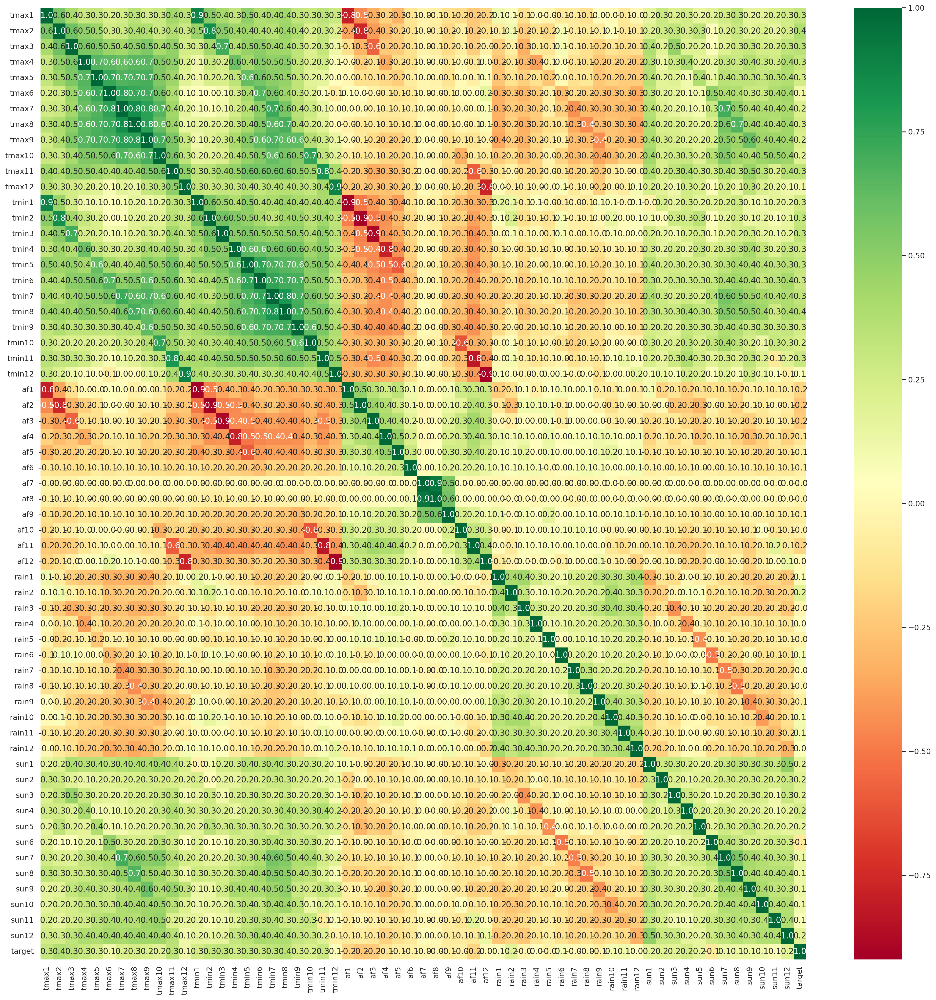

In [104]:
import seaborn as sns

#Plot correlation matrix
corr = df_upsampled.corr()
plt.figure(figsize=(25, 25))
sns.heatmap(corr, annot=True, fmt='.1f', cmap="RdYlGn")
# plt.savefig("completedata_correlation_matrix.pdf", bbox_inches='tight', format='pdf')
plt.show()

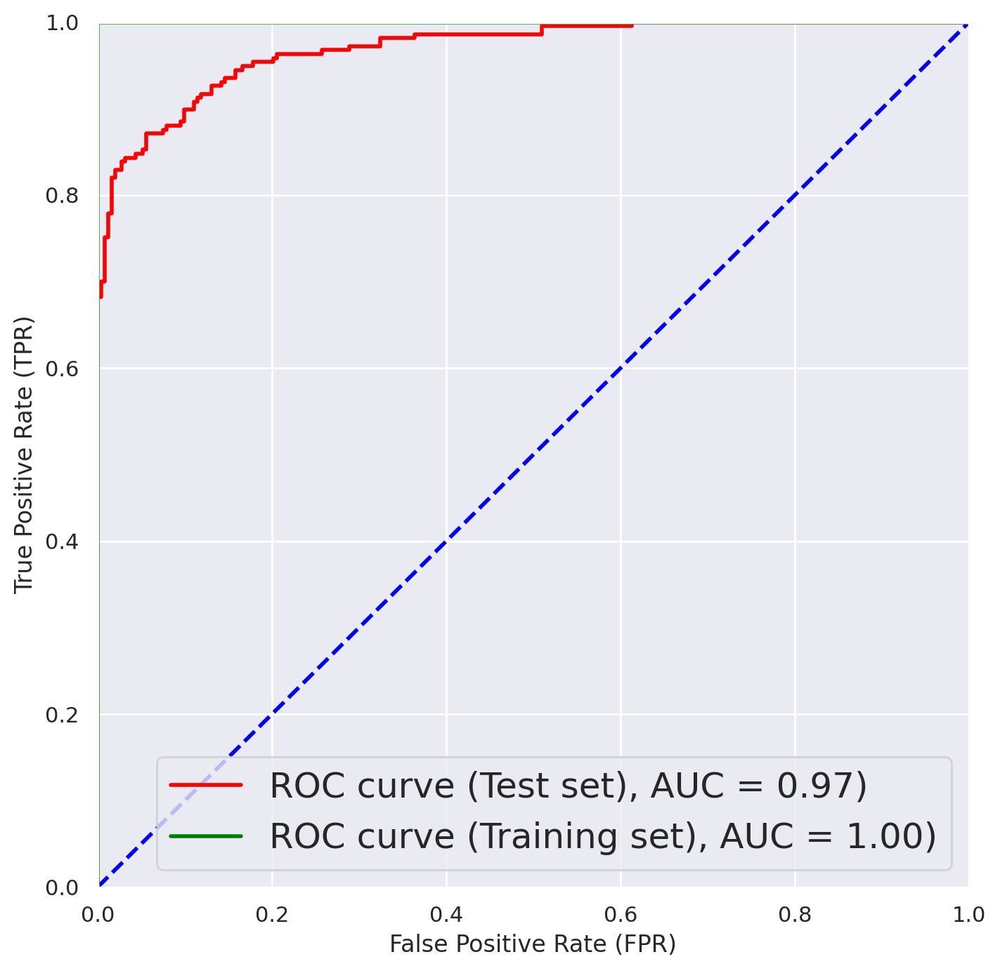

In [105]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = adabest.predict_proba(X_test)[:, 1]
p_train = adabest.predict_proba(X_train)[:, 1]


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)
    # plt.xlim([-0.05, 1.05])

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc="lower right", fontsize=18)
#     plt.savefig("completedata_ROC_curve.pdf",
#                 bbox_inches='tight',
#                 format='pdf')

    plt.show()


plotROC(y_test, p_test, y_train, p_train)

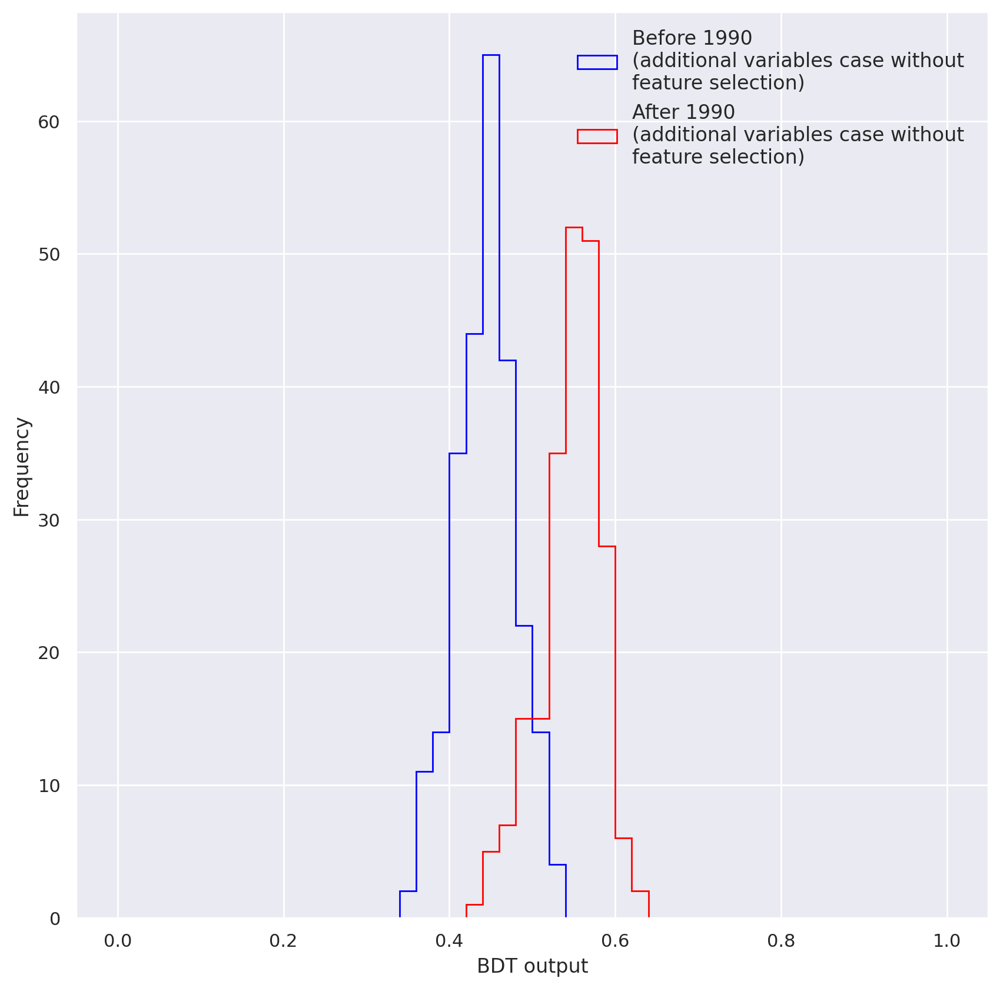

In [106]:
#Plot the BDT output for the test set for before and after 1990 instead of signal and background
plt.figure(figsize=(10, 10))
plt.hist(
    p_test[y_test == 0],
    bins=50,
    range=(0, 1),
    histtype='step',
    color='blue',
    label=
    'Before 1990 \n(additional variables case without \nfeature selection)')
plt.hist(
    p_test[y_test == 1],
    bins=50,
    range=(0, 1),
    histtype='step',
    color='red',
    label='After 1990 \n(additional variables case without \nfeature selection)'
)
plt.xlabel('BDT output')
plt.ylabel('Frequency')
plt.legend(frameon=False, fontsize=12, loc='upper right')
# plt.savefig("completedata_BDT_output_nofeatureselection.pdf", bbox_inches='tight', format='pdf')
plt.show()

In [107]:
# Calculate the significance of the separation
from scipy.stats import norm


def significance(p_test, y_test):
    s = p_test[y_test == 0]
    b = p_test[y_test == 1]
    s_mean = np.mean(s)
    s_std = np.std(s)
    b_mean = np.mean(b)
    b_std = np.std(b)
    significance = (s_mean - b_mean) / np.sqrt(s_std**2 + b_std**2)
    return significance


print("Significance: %f" % significance(p_test, y_test))

Significance: -1.988051


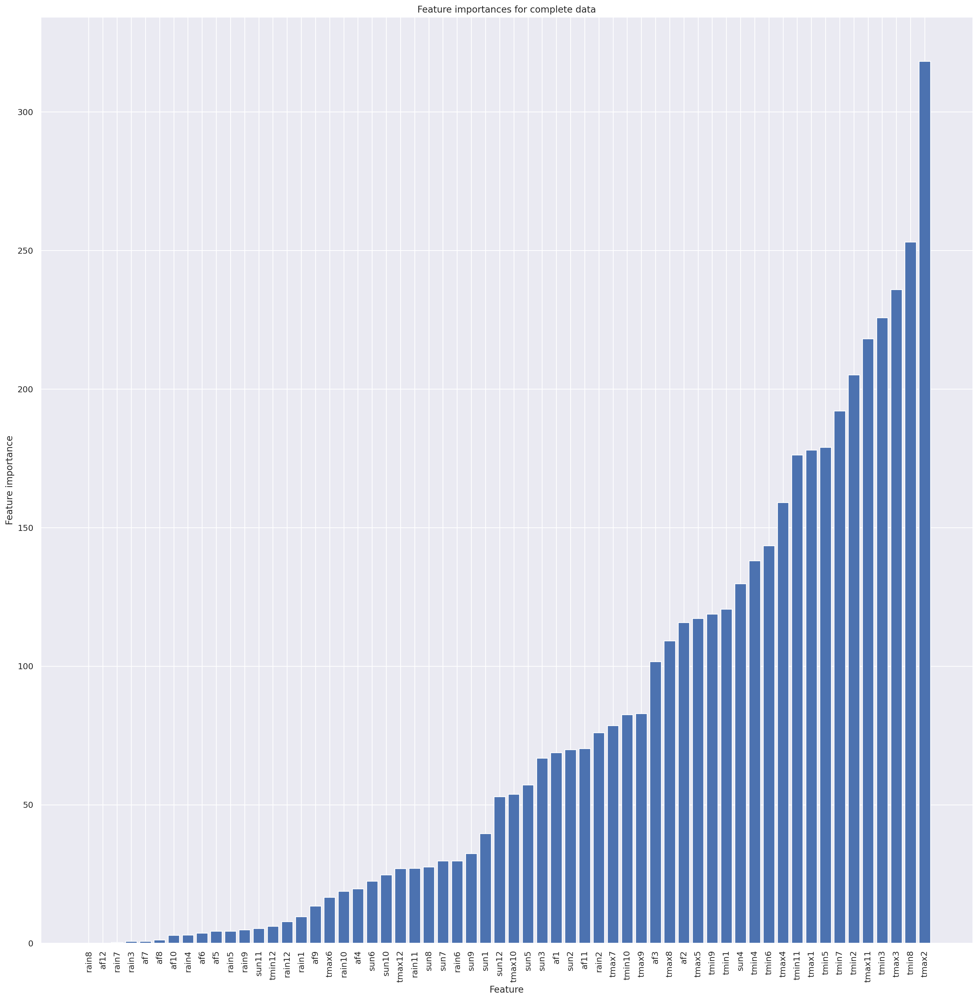

In [108]:
#Rank the features
selector = SelectKBest(f_classif, k=23)
selector.fit(X_train, y_train)

importances = selector.scores_

indices = np.argsort(importances)

#Plot the feature importances in order in a bar chart
plt.figure(figsize=(22, 22))
#Increase font size
plt.rcParams.update({'font.size': 25})
plt.bar(range(len(selector.scores_)), importances[indices])
plt.xticks(range(len(selector.scores_)), X_train.columns[indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Feature importance')
#title
plt.title('Feature importances for complete data')
# plt.savefig("completedata_feature_importance.pdf", bbox_inches='tight', format='pdf')
plt.show()

In [109]:
#After selecting the best features, we can train a new model using only the selected features
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

dt = DecisionTreeClassifier(max_depth=5,
                            min_samples_leaf=25,
                            max_features=10,
                            splitter="best",
                            criterion="gini")

ada = AdaBoostClassifier(dt, n_estimators=100, random_state=1)

params = {
    'estimator__min_samples_leaf': [10, 25, 50],
    'estimator__max_depth': [2, 3],
    'estimator__max_features': [3, 5, 7, 10, 20],
    'n_estimators': [25, 30]
}

print("Training...")
rcv = GridSearchCV(ada, params, verbose=1, n_jobs=-1)
rcv.fit(X_train_selected, y_train)

print("Best set of parameters: %s" % rcv.best_params_)
adabest = rcv.best_estimator_
adabest.fit(X_train_selected, y_train)

print("Training set score: %f" % adabest.score(X_train_selected, y_train))
print("Test set score:     %f" % adabest.score(X_test_selected, y_test))

# Compute the confidence interval for the test set accuracy
from sklearn.utils import resample
from sklearn.metrics import accuracy_score

# Initialize an empty list to store the accuracies
accuracies = []

# Iterate over 1000 bootstrap samples
for i in range(1000):

    # Resample the test set
    X_test_resampled, y_test_resampled = resample(X_test_selected, y_test)

    # Compute the accuracy of the model on the resampled test set
    accuracy = adabest.score(X_test_resampled, y_test_resampled)

    # Append the accuracy to the list
    accuracies.append(accuracy)

# Compute the 95% confidence interval
confidence_interval = np.percentile(accuracies, [2.5, 97.5])
print("Confidence interval: [%f, %f]" %
      (confidence_interval[0], confidence_interval[1]))

Training...
Fitting 5 folds for each of 60 candidates, totalling 300 fits
Best set of parameters: {'estimator__max_depth': 3, 'estimator__max_features': 7, 'estimator__min_samples_leaf': 10, 'n_estimators': 30}
Training set score: 0.951493
Test set score:     0.797872
Confidence interval: [0.761702, 0.831968]


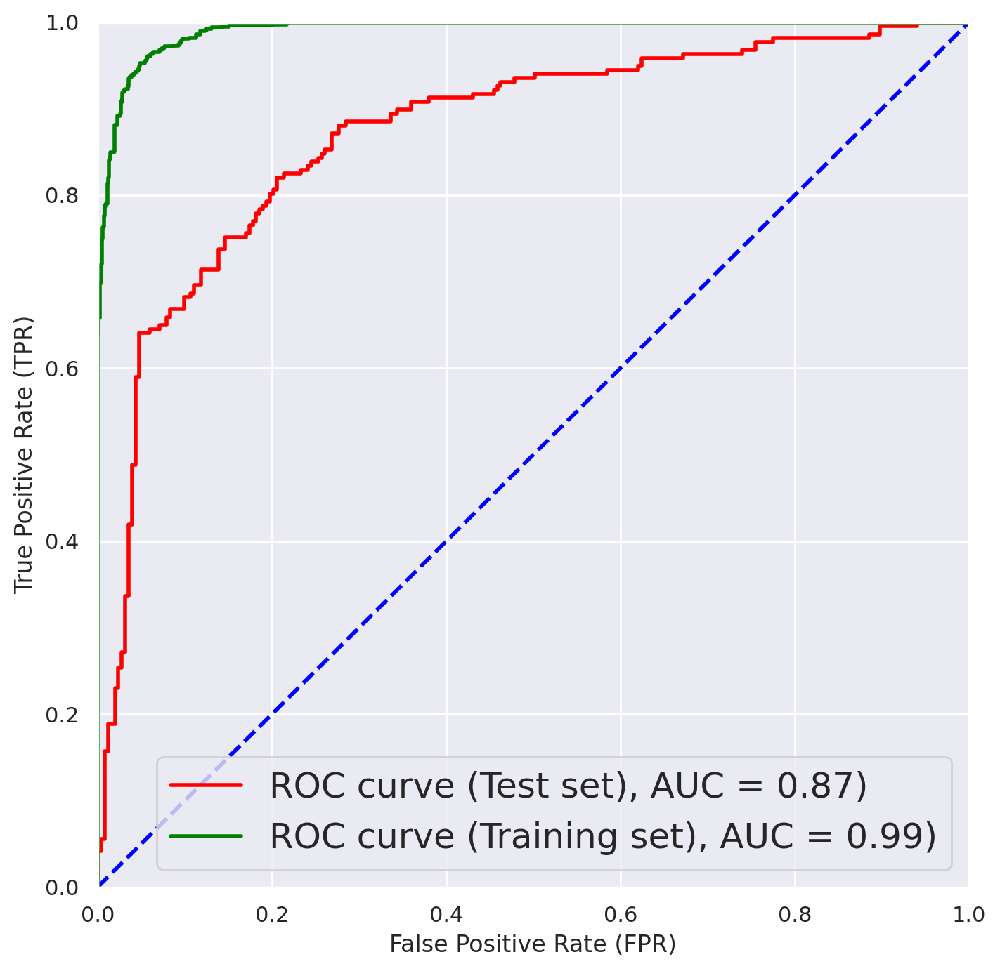

In [110]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = adabest.predict_proba(X_test_selected)[:, 1]
p_train = adabest.predict_proba(X_train_selected)[:, 1]


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc="lower right", fontsize=18)
#     plt.savefig("completedata_BDT_ROC_curve_withfeatureselection.pdf",
#                 bbox_inches='tight',
#                 format='pdf')
    plt.show()


plotROC(y_test, p_test, y_train, p_train)

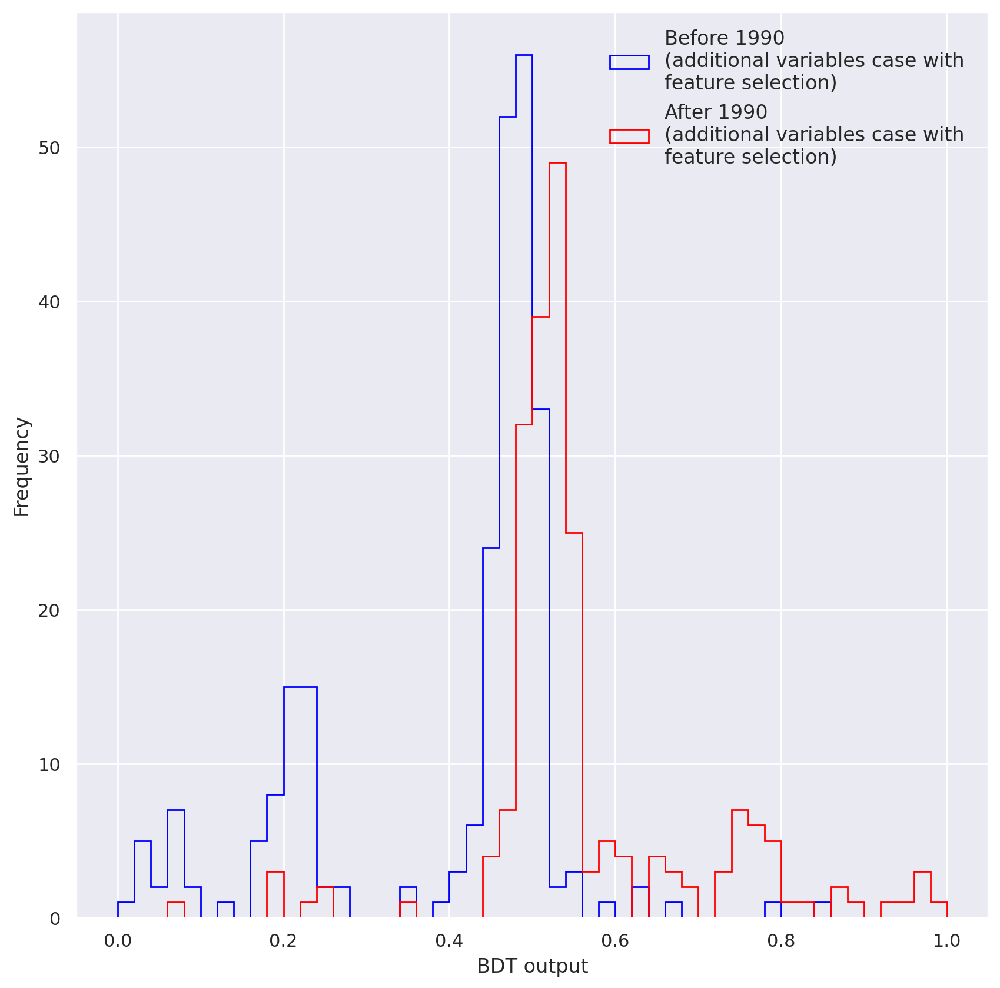

In [111]:
#Plot the BDT output for the test set for before and after 1990 instead of signal and background
plt.figure(figsize=(10, 10))
plt.hist(
    p_test[y_test == 0],
    bins=50,
    range=(0, 1),
    histtype='step',
    color='blue',
    label='Before 1990 \n(additional variables case with \nfeature selection)')
plt.hist(
    p_test[y_test == 1],
    bins=50,
    range=(0, 1),
    histtype='step',
    color='red',
    label='After 1990 \n(additional variables case with \nfeature selection)')
plt.xlabel('BDT output')
plt.ylabel('Frequency')
plt.legend(frameon=False, fontsize=12, loc='upper right')
# plt.savefig("completedata_BDT_output_withfeatureselection.pdf", bbox_inches='tight', format='pdf')
plt.show()

Try a KNN and SVM model.  



In [112]:
import numpy as np
import matplotlib.pyplot as plt

#Train a KNN
from sklearn.neighbors import KNeighborsClassifier

#Optimise the KNN
from sklearn.model_selection import GridSearchCV

knn = KNeighborsClassifier()
parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}
clf = GridSearchCV(knn, parameters, cv=5)
clf.fit(X_train, y_train)
print('Best parameters:', clf.best_params_)
print('Best score:', clf.best_score_)
knn = clf.best_estimator_

#Calculate the KNN output
knn_output_test = knn.predict_proba(X_test)[:, 1]
knn_output_train = knn.predict_proba(X_train)[:, 1]

Best parameters: {'n_neighbors': 1}
Best score: 0.959486524822695


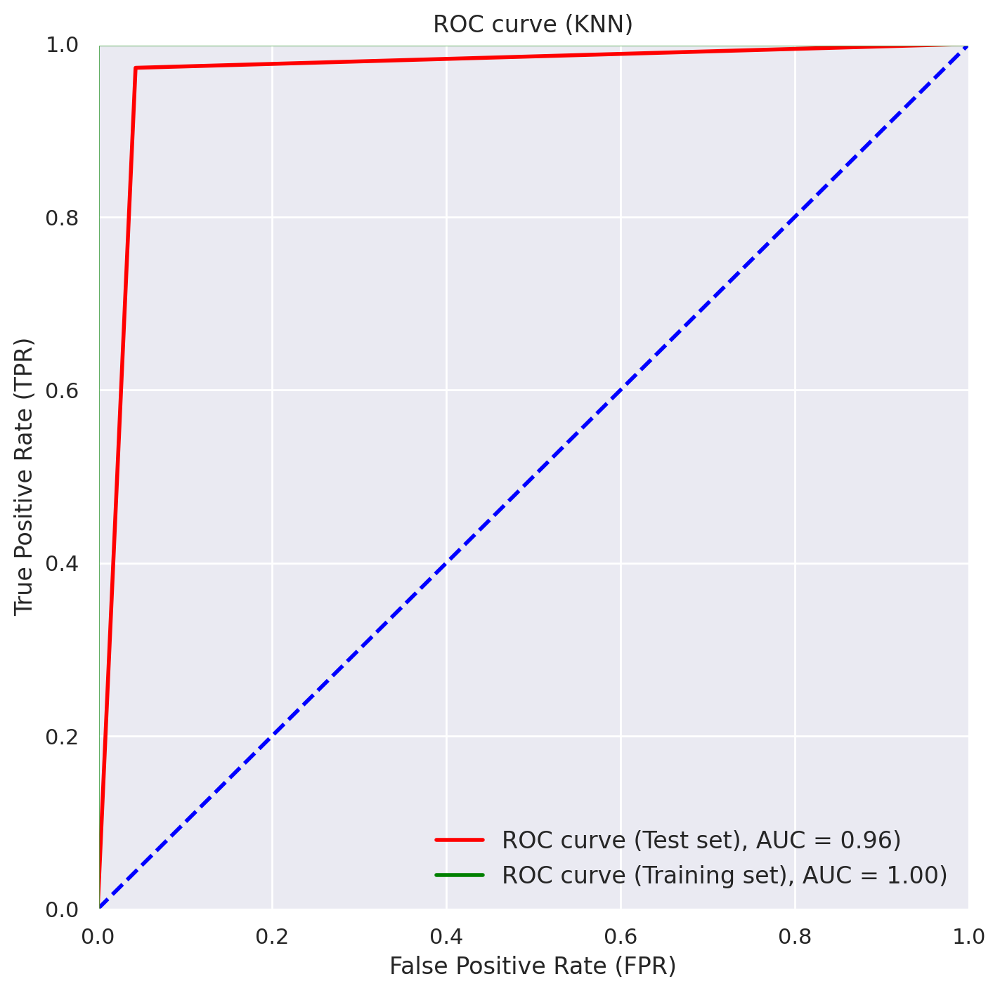

In [113]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = knn_output_test
p_train = knn_output_train


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc="lower right", fontsize=12, frameon=False)
    plt.title('ROC curve (KNN)')
    #reset rcParams
    plt.rcParams.update(plt.rcParamsDefault)
    #     plt.savefig("completedata_KNN_ROC_curve.pdf", bbox_inches='tight', format='pdf')
    plt.show()


plotROC(y_test, p_test, y_train, p_train)

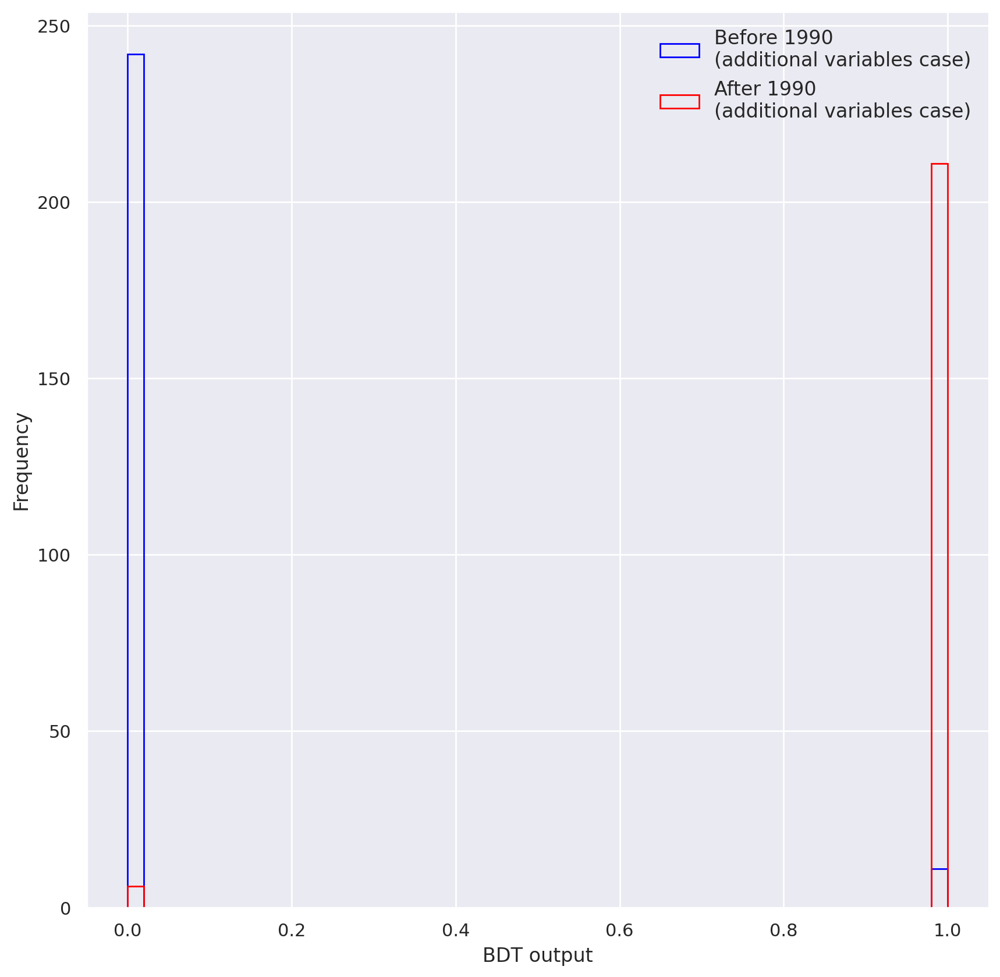

In [114]:
sns.set()
# Plot the BDT output for the test set for before and after 1990 instead of signal and background
plt.figure(figsize=(10, 10))
plt.hist(p_test[y_test == 0],
         bins=50,
         range=(0, 1),
         histtype='step',
         color='blue',
         label='Before 1990 \n(additional variables case)')
plt.hist(p_test[y_test == 1],
         bins=50,
         range=(0, 1),
         histtype='step',
         color='red',
         label='After 1990 \n(additional variables case)')
plt.xlabel('BDT output')
plt.ylabel('Frequency')
plt.legend(frameon=False, fontsize=12, loc='upper right')
# plt.savefig("completedata_KNN_output.pdf", bbox_inches='tight', format='pdf')
plt.show()

In [115]:
# Calculate the significance of the separation
from scipy.stats import norm


def significance(p_test, y_test):
    s = p_test[y_test == 0]
    b = p_test[y_test == 1]
    s_mean = np.mean(s)
    s_std = np.std(s)
    b_mean = np.mean(b)
    b_std = np.std(b)
    significance = (s_mean - b_mean) / np.sqrt(s_std**2 + b_std**2)
    return significance


print("Significance: %f" % significance(p_test, y_test))

Significance: -3.549733


Best parameters: {'C': 10, 'gamma': 0.01}
Best score: 0.9568184397163121


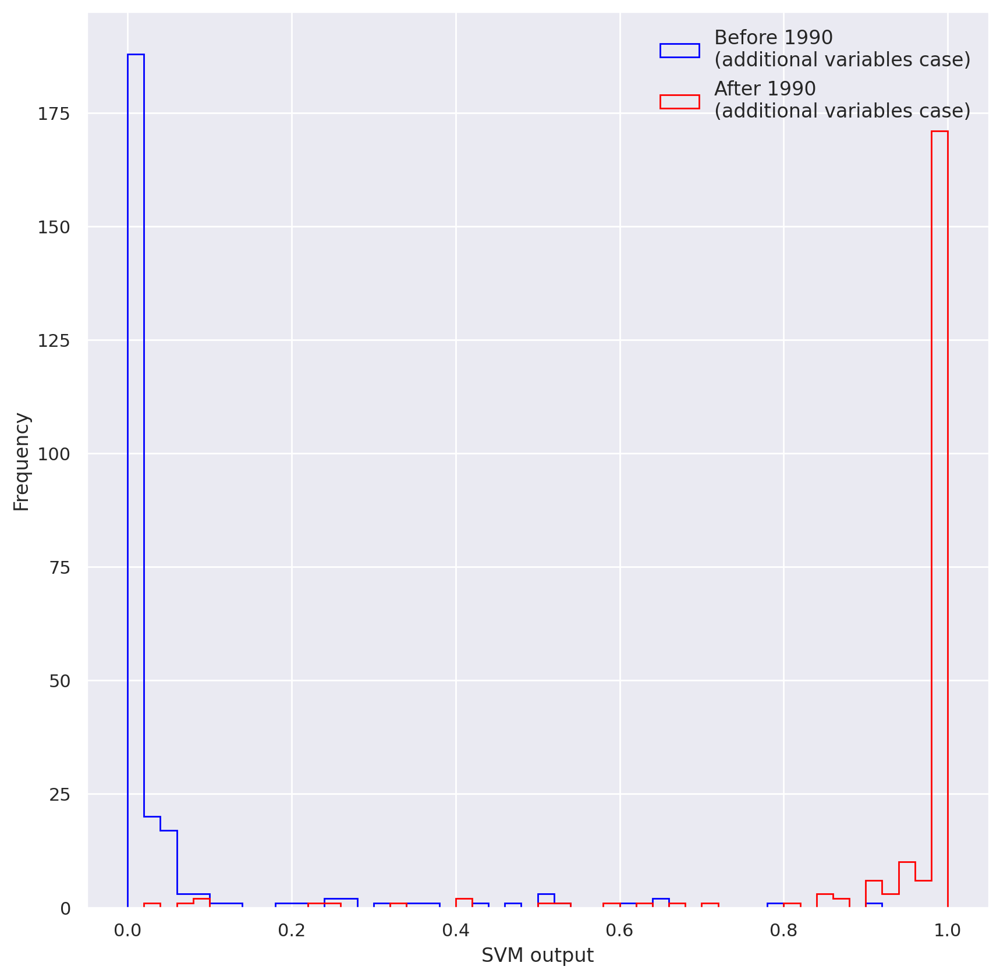

In [116]:
from sklearn.svm import SVC

#Optimise the SVM
from sklearn.model_selection import GridSearchCV
svm = SVC(kernel='rbf', probability=True)
parameters = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001]}
clf = GridSearchCV(svm, parameters, cv=5)
clf.fit(X_train, y_train)
print('Best parameters:', clf.best_params_)
print('Best score:', clf.best_score_)
svm = clf.best_estimator_

#Calculate the SVM output
svm_output_test = svm.predict_proba(X_test)[:,1]
svm_output_train = svm.predict_proba(X_train)[:,1]


#Plot the BDT output for the test set for before and after 1990 instead of signal and background
plt.figure(figsize=(10, 10))
plt.hist(svm_output_test[y_test == 0], bins=50, range=(0,1), histtype='step', color='blue', label='Before 1990 \n(additional variables case)')
plt.hist(svm_output_test[y_test == 1], bins=50, range=(0,1), histtype='step', color='red', label='After 1990 \n(additional variables case)')
plt.xlabel('SVM output')
plt.ylabel('Frequency')
plt.legend(frameon=False, fontsize=12, loc='upper right')
# plt.savefig("completedata_SVM_output.pdf", bbox_inches='tight', format='pdf')
plt.show()

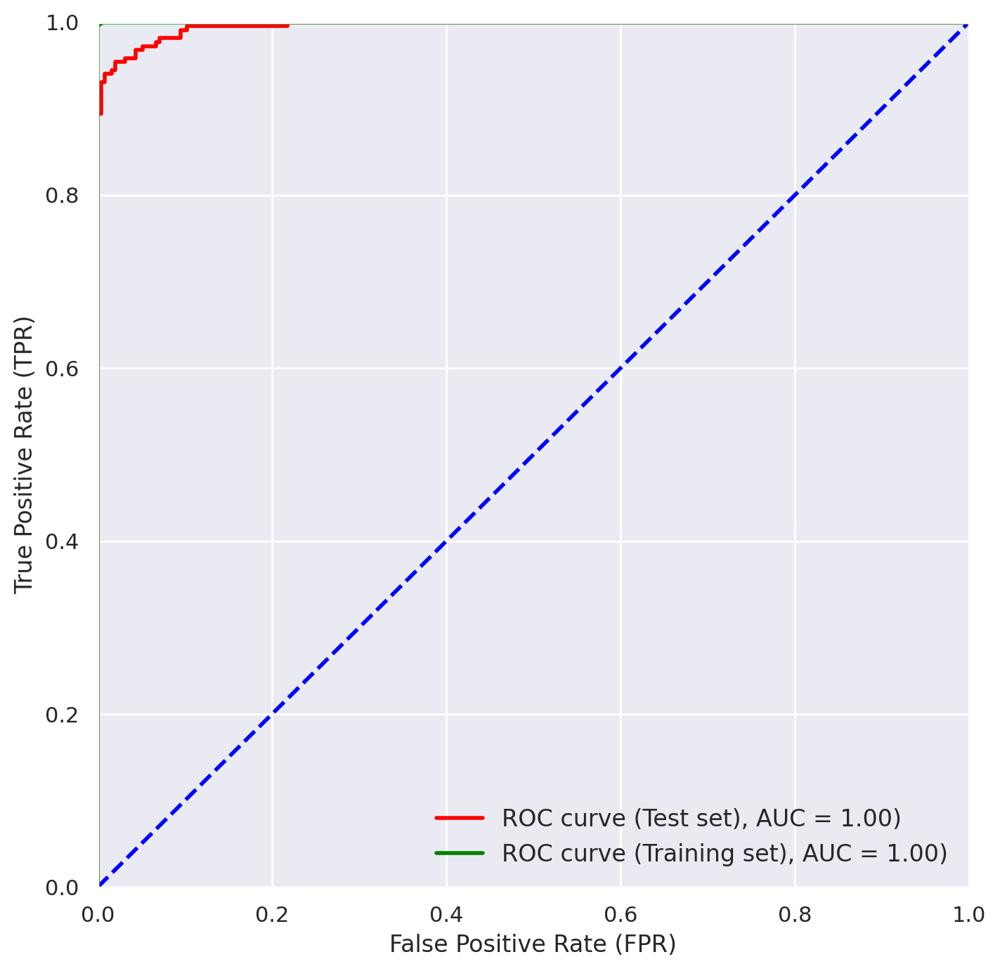

In [117]:
from sklearn.metrics import roc_curve, auc, confusion_matrix
import matplotlib.pyplot as plt

p_test = svm_output_test
p_train = svm_output_train


def plotROC(y_test, p_test, y_train, p_train):
    plt.figure(figsize=(8, 8))
    plt.plot([0, 1], [0, 1], color='blue', lw=2, linestyle='--')
    #Plot the ROC curve for the test set
    bad_test, good_test, _ = roc_curve(y_test, p_test)
    roc_auc_test = auc(bad_test, good_test)
    plt.plot(bad_test,
             good_test,
             color='red',
             lw=2,
             label='ROC curve (Test set), AUC = %0.2f)' % roc_auc_test)

    #Plot the ROC curve for the training set
    bad_train, good_train, _ = roc_curve(y_train, p_train)
    roc_auc_train = auc(bad_train, good_train)
    plt.plot(bad_train,
             good_train,
             color='green',
             lw=2,
             label='ROC curve (Training set), AUC = %0.2f)' % roc_auc_train)
    # plt.xlim([-0.05, 1.05])

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.legend(loc="lower right", fontsize=12, frameon=False)
#     plt.savefig("completedata_SVM_ROC_curve.pdf",
#                 bbox_inches='tight',
#                 format='pdf')
    plt.show()


plotROC(y_test, p_test, y_train, p_train)

In [118]:
# Calculate the significance of the separation
from scipy.stats import norm


def significance(p_test, y_test):
    s = p_test[y_test == 0]
    b = p_test[y_test == 1]
    s_mean = np.mean(s)
    s_std = np.std(s)
    b_mean = np.mean(b)
    b_std = np.std(b)
    significance = (s_mean - b_mean) / np.sqrt(s_std**2 + b_std**2)
    return significance


print("Significance: %f" % significance(p_test, y_test))

Significance: -4.160763
